# **Olist Customer Analysis**

**Indonesian Language**

Pada dataset ini kita akan melakukan analisa terhadap pembelian produk. Kita akan menggunakan pendekatan eksplorasi data dan pendekatan RFM untuk mencari tahu:
1. Apa saja kategori produk dengan Penjualan dan Revenue Terbanyak?
2. Apa saja kategori Produk dengan Tingkat Skor RFM terbaik?
3. Bagaimana Trend dan siklus penjualan masing-masing kategori produk?
4. Produk mana yang memiliki pertumbuhan signifikan dari tahun-tahun sebelumnya?

Dari informasi diatas kita akan melakukan analisa strategi bisnis yang dapat dilakukan perusahaan untuk menghadapi habit customer seperti dataset ini.

**English Translation**


In this dataset, we will conduct an analysis of product purchases using both exploratory data analysis and the RFM approach to find out:

1.  Which product categories have the Highest Sales and Revenue?
2.  Which product categories exhibit the Best RFM Scores?
3.  What are the Trends and Sales Cycles for each product category?
4.  Which products show significant growth compared to previous years?
From the information above, we will analyze business strategies that the company can implement to address customer habits revealed in this dataset.



In [2]:
#import library yang dibutuhkan
import sqlite3
import numpy as np
import pandas as pd
from google.colab import files
from google.colab import drive
from datetime import datetime

drive.mount('/content/drive')

pd.set_option('display.max_columns',None)
pd.set_option('display.max_rows',None)

Mounted at /content/drive


In [3]:
#connect ke database
conn = sqlite3.connect('/content/drive/MyDrive/tugas_pacmann/olist.db')

In [4]:
#connect ke database
cursor = conn.cursor()

In [5]:
#connect ke database
cursor.execute("SELECT name FROM sqlite_master WHERE type='table';")
tables = cursor.fetchall()

In [6]:
# Menampilkan nama-nama tabel
print("Tables in the database:")
for table in tables:
    print(table[0])

Tables in the database:
olist_order_customer_dataset
olist_order_dataset
olist_order_reviews_dataset
olist_order_payments_dataset
olist_order_items_dataset
olist_products_dataset
olist_sellers_dataset
olist_geolocation_dataset
product_category_name_translation


In [7]:
# membuat fungsi untuk menconvert waktu
def convert_to_date(x):
  date = pd.to_datetime(x,format='%Y-%m-%d %H:%M:%S')
  return date

In [8]:
# Mengambil data dari tabel SQL ke DataFrame
query_customer = "SELECT * FROM olist_order_customer_dataset;"
query_order = "SELECT * FROM olist_order_dataset;"
query_reviews = "SELECT * FROM olist_order_reviews_dataset;"
query_payments = "SELECT * FROM olist_order_payments_dataset;"
query_items = "SELECT * FROM olist_order_items_dataset;"
query_products = "SELECT * FROM olist_products_dataset;"
query_sellers = "SELECT * FROM olist_sellers_dataset;"
query_geolocation = "SELECT * FROM olist_geolocation_dataset;"
query_category_name = "SELECT * FROM product_category_name_translation;"

df_customer = pd.read_sql_query(query_customer, conn, index_col='index')
df_order = pd.read_sql_query(query_order, conn,index_col='index')
df_reviews = pd.read_sql_query(query_reviews, conn, index_col='index')
df_payments = pd.read_sql_query(query_payments, conn, index_col='index')
df_items = pd.read_sql_query(query_items, conn, index_col='index')
df_products = pd.read_sql_query(query_products, conn, index_col='index')
df_sellers = pd.read_sql_query(query_sellers, conn, index_col='index')
df_geolocation = pd.read_sql_query(query_geolocation, conn, index_col='index')
df_category_name = pd.read_sql_query(query_category_name, conn, index_col='index')

## **Customer Table**

In [9]:
#melihat jumlah baris dan kolom tabel customer
df_customer.shape

(99441, 5)

In [10]:
#eksplorasi tipe data tabel
df_customer.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 99441 entries, 0 to 99440
Data columns (total 5 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   customer_id               99441 non-null  object
 1   customer_unique_id        99441 non-null  object
 2   customer_zip_code_prefix  99441 non-null  int64 
 3   customer_city             99441 non-null  object
 4   customer_state            99441 non-null  object
dtypes: int64(1), object(4)
memory usage: 4.6+ MB


In [11]:
#melihat null values pada tabel
df_customer.isna().sum()

customer_id                 0
customer_unique_id          0
customer_zip_code_prefix    0
customer_city               0
customer_state              0
dtype: int64

In [12]:
#mengubah nama kolom zip code
df_customer.rename(columns={'customer_zip_code_prefix':'zip_code_prefix'}, inplace=True)

In [13]:
#dataframe
df_customer.head(3)

,customer_id,customer_unique_id,zip_code_prefix,customer_city,customer_state
index,,,,,
0,06b8999e2fba1a1fbc88172c00ba8bc7,861eff4711a542e4b93843c6dd7febb0,14409,franca,SP
1,18955e83d337fd6b2def6b18a428ac77,290c77bc529b7ac935b93aa66c333dc3,9790,sao bernardo do campo,SP
2,4e7b3e00288586ebd08712fdd0374a03,060e732b5b29e8181a18229c7b0b2b5e,1151,sao paulo,SP


In [14]:
#melihat nilai unik
df_customer['customer_id'].nunique()

99441

## **Order Table**

In [15]:
#melihat jumlah kolom dan baris tabel order
df_order.shape

(99441, 8)

In [16]:
#lihat format data pada tabel order
df_order.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 99441 entries, 0 to 99440
Data columns (total 8 columns):
 #   Column                         Non-Null Count  Dtype 
---  ------                         --------------  ----- 
 0   order_id                       99441 non-null  object
 1   customer_id                    99441 non-null  object
 2   order_status                   99441 non-null  object
 3   order_purchase_timestamp       99441 non-null  object
 4   order_approved_at              99281 non-null  object
 5   order_delivered_carrier_date   97658 non-null  object
 6   order_delivered_customer_date  96476 non-null  object
 7   order_estimated_delivery_date  99441 non-null  object
dtypes: object(8)
memory usage: 6.8+ MB


In [17]:
# melihat null values pada tabel order
df_order.isna().sum()

order_id                            0
customer_id                         0
order_status                        0
order_purchase_timestamp            0
order_approved_at                 160
order_delivered_carrier_date     1783
order_delivered_customer_date    2965
order_estimated_delivery_date       0
dtype: int64

In [18]:
#isi row kosong dengan timestamp
df_order.fillna(pd.Timestamp('1970-01-01 00:00:00'), inplace=True)

In [19]:
# melihat format tanggal pada kolom order_delivered
df_order['order_delivered_customer_date'].value_counts().head(10)

1970-01-01 00:00:00    2965
2018-07-24 21:36:42       3
2018-05-08 23:38:46       3
2018-05-14 20:02:44       3
2017-12-02 00:26:45       3
2018-05-08 19:36:48       3
2016-10-27 17:32:07       3
2018-02-14 21:09:19       3
2017-06-19 18:47:51       3
2018-03-16 13:28:28       2
Name: order_delivered_customer_date, dtype: int64

In [20]:
#cek lagi apabila masih ada nilai null
df_order.isna().sum()

order_id                         0
customer_id                      0
order_status                     0
order_purchase_timestamp         0
order_approved_at                0
order_delivered_carrier_date     0
order_delivered_customer_date    0
order_estimated_delivery_date    0
dtype: int64

In [21]:
#lihat dataframe
df_order.head(3)

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date
index,,,,,,,,
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18 00:00:00
1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13 00:00:00
2,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,delivered,2018-08-08 08:38:49,2018-08-08 08:55:23,2018-08-08 13:50:00,2018-08-17 18:06:29,2018-09-04 00:00:00


In [22]:
#lihat jumlah nilai unik pada tabel order
df_order['order_id'].nunique()

99441

## **Reviews Table**

In [23]:
#melihat jumlah kolom dan baris tabel
df_reviews.shape

(99224, 7)

In [24]:
#lihat format data pada tabel order
df_reviews.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 99224 entries, 0 to 99223
Data columns (total 7 columns):
 #   Column                   Non-Null Count  Dtype 
---  ------                   --------------  ----- 
 0   review_id                99224 non-null  object
 1   order_id                 99224 non-null  object
 2   review_score             99224 non-null  int64 
 3   review_comment_title     11568 non-null  object
 4   review_comment_message   40977 non-null  object
 5   review_creation_date     99224 non-null  object
 6   review_answer_timestamp  99224 non-null  object
dtypes: int64(1), object(6)
memory usage: 6.1+ MB


In [25]:
# melihat null values pada tabel order
df_reviews.isna().sum()

review_id                      0
order_id                       0
review_score                   0
review_comment_title       87656
review_comment_message     58247
review_creation_date           0
review_answer_timestamp        0
dtype: int64

In [26]:
#melihat isi dari kolom yang mengandung null
df_reviews.loc[df_reviews['review_comment_title'].isna()==True,:].head(5)

,review_id,order_id,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp
index,,,,,,,
0,7bc2406110b926393aa56f80a40eba40,73fc7af87114b39712e6da79b0a377eb,4,None,None,2018-01-18 00:00:00,2018-01-18 21:46:59
1,80e641a11e56f04c1ad469d5645fdfde,a548910a1c6147796b98fdf73dbeba33,5,None,None,2018-03-10 00:00:00,2018-03-11 03:05:13
2,228ce5500dc1d8e020d8d1322874b6f0,f9e4b658b201a9f2ecdecbb34bed034b,5,None,None,2018-02-17 00:00:00,2018-02-18 14:36:24
3,e64fb393e7b32834bb789ff8bb30750e,658677c97b385a9be170737859d3511b,5,None,Recebi bem antes do prazo estipulado.,2017-04-21 00:00:00,2017-04-21 22:02:06
4,f7c4243c7fe1938f181bec41a392bdeb,8e6bfb81e283fa7e4f11123a3fb894f1,5,None,Parabéns lojas lannister adorei comprar pela I...,2018-03-01 00:00:00,2018-03-02 10:26:53


In [27]:
#mengisi kolom null
df_reviews.fillna('-',inplace=True)

In [28]:
#cek kembali apabila ada null values
df_reviews.isna().sum()

review_id                  0
order_id                   0
review_score               0
review_comment_title       0
review_comment_message     0
review_creation_date       0
review_answer_timestamp    0
dtype: int64

In [29]:
#lihat dataframe
df_reviews.head(3)

,review_id,order_id,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp
index,,,,,,,
0,7bc2406110b926393aa56f80a40eba40,73fc7af87114b39712e6da79b0a377eb,4,-,-,2018-01-18 00:00:00,2018-01-18 21:46:59
1,80e641a11e56f04c1ad469d5645fdfde,a548910a1c6147796b98fdf73dbeba33,5,-,-,2018-03-10 00:00:00,2018-03-11 03:05:13
2,228ce5500dc1d8e020d8d1322874b6f0,f9e4b658b201a9f2ecdecbb34bed034b,5,-,-,2018-02-17 00:00:00,2018-02-18 14:36:24


In [30]:
#melihat jumlah nilai unik
df_reviews['order_id'].nunique()

98673

In [31]:
#melihat jumlah nilai unik
df_reviews['review_id'].nunique()

98410

In [32]:
#melihat nilai unik
df_reviews['order_id'].value_counts().head(10)

c88b1d1b157a9999ce368f218a407141    3
8e17072ec97ce29f0e1f111e598b0c85    3
df56136b8031ecd28e200bb18e6ddb2e    3
03c939fd7fd3b38f8485a0f95798f1f6    3
5cb890a68b91b6158d69257e4e2bc359    2
2143393cca994a4b8235bc1d67ded772    2
25320e12b3d6e8f54f17389037588bba    2
0176a6846bcb3b0d3aa3116a9a768597    2
d9e44c3fd2ce16086619f299e92e12d8    2
21cb4961399b846b168d0358100f473b    2
Name: order_id, dtype: int64

In [33]:
#menghapus duplikat
df_reviews = df_reviews.sort_values(by='review_answer_timestamp', ascending=False)
df_reviews = df_reviews.drop_duplicates(subset='order_id')

In [34]:
#cek kembali
df_reviews['order_id'].nunique()

98673

## **Payments Table**

In [35]:
#melihat jumlah kolom dan baris tabel
df_payments.shape

(103886, 5)

In [36]:
#lihat format data pada tabel
df_payments.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 103886 entries, 0 to 103885
Data columns (total 5 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   order_id              103886 non-null  object 
 1   payment_sequential    103886 non-null  int64  
 2   payment_type          103886 non-null  object 
 3   payment_installments  103886 non-null  int64  
 4   payment_value         103886 non-null  float64
dtypes: float64(1), int64(2), object(2)
memory usage: 4.8+ MB


In [37]:
# melihat null values pada tabel
df_payments.isna().sum()

order_id                0
payment_sequential      0
payment_type            0
payment_installments    0
payment_value           0
dtype: int64

In [38]:
#lihat dataframe
df_payments.head(3)

,order_id,payment_sequential,payment_type,payment_installments,payment_value
index,,,,,
0,b81ef226f3fe1789b1e8b2acac839d17,1,credit_card,8,99.33
1,a9810da82917af2d9aefd1278f1dcfa0,1,credit_card,1,24.39
2,25e8ea4e93396b6fa0d3dd708e76c1bd,1,credit_card,1,65.71


In [39]:
#melihat jumlah nilai unik
df_payments['order_id'].nunique()

99440

### **Catatan**

Transaksi dibawah ini adalah transaksi cicilan sehingga satu order_order dapat ditemukan berulang, sebanyak jumlah pembayaran cicilan yang dilakukan atas pembelian ni

In [40]:
#cek payment
df_payments[df_payments['order_id']=='fa65dad1b0e818e3ccc5cb0e39231352'].head(29).sort_values(by='payment_sequential', ascending=True)

,order_id,payment_sequential,payment_type,payment_installments,payment_value
index,,,,,
14321,fa65dad1b0e818e3ccc5cb0e39231352,1,voucher,1,3.71
23074,fa65dad1b0e818e3ccc5cb0e39231352,2,voucher,1,8.51
65641,fa65dad1b0e818e3ccc5cb0e39231352,3,voucher,1,2.95
9985,fa65dad1b0e818e3ccc5cb0e39231352,4,voucher,1,29.16
28330,fa65dad1b0e818e3ccc5cb0e39231352,5,voucher,1,0.66
29648,fa65dad1b0e818e3ccc5cb0e39231352,6,voucher,1,5.02
82593,fa65dad1b0e818e3ccc5cb0e39231352,7,voucher,1,0.32
68853,fa65dad1b0e818e3ccc5cb0e39231352,8,voucher,1,26.02
17274,fa65dad1b0e818e3ccc5cb0e39231352,9,voucher,1,1.08


In [41]:
#lihat jumlah transaksi per masing-masing metoe
df_payments['payment_type'].value_counts()

credit_card    76795
boleto         19784
voucher         5775
debit_card      1529
not_defined        3
Name: payment_type, dtype: int64

In [42]:
#agregasi kolom untuk menyederhanakan tabel
df_payments_agg = df_payments.groupby(by=['order_id']).size().reset_index(name='Tenure').sort_values(by='Tenure',ascending=False)
df_payments_duplicate_payment_type = df_payments[['order_id','payment_type']].drop_duplicates(subset='order_id',keep='first')
df_payments_sum = df_payments.groupby(by=['order_id'])['payment_value'].sum().reset_index(name='Total Payments')
df_payments_agg = pd.merge(df_payments_agg, df_payments_sum, on='order_id',how='left')
df_payments_agg = pd.merge(df_payments_agg, df_payments_duplicate_payment_type, on='order_id',how='left')

In [43]:
#cek tabel
df_payments_duplicate_payment_type.head(2)

,order_id,payment_type
index,,
0,b81ef226f3fe1789b1e8b2acac839d17,credit_card
1,a9810da82917af2d9aefd1278f1dcfa0,credit_card


In [44]:
#cek tabel setelah agregasi
df_payments_agg.head(2)

,order_id,Tenure,Total Payments,payment_type
0,fa65dad1b0e818e3ccc5cb0e39231352,29,457.99,voucher
1,ccf804e764ed5650cd8759557269dc13,26,62.68,voucher


In [45]:
#lihat jumlah kolom unik
df_payments_agg['order_id'].nunique()

99440

In [46]:
#lihat dataframe
df_payments[df_payments['order_id']=='1d251ab94983c4adb11e4b168abb1439']

,order_id,payment_sequential,payment_type,payment_installments,payment_value
index,,,,,
15259,1d251ab94983c4adb11e4b168abb1439,2,credit_card,4,65.96
32551,1d251ab94983c4adb11e4b168abb1439,3,voucher,1,53.89
93089,1d251ab94983c4adb11e4b168abb1439,1,credit_card,6,118.56


In [47]:
#lihat dataframe
df_payments_agg[df_payments_agg['order_id']=='1d251ab94983c4adb11e4b168abb1439']

,order_id,Tenure,Total Payments,payment_type
293,1d251ab94983c4adb11e4b168abb1439,3,238.41,credit_card


## **Items Table**

In [48]:
#melihat jumlah kolom dan baris tabel
df_items.shape

(112650, 7)

In [49]:
#lihat format data pada tabel
df_items.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 112650 entries, 0 to 112649
Data columns (total 7 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   order_id             112650 non-null  object 
 1   order_item_id        112650 non-null  int64  
 2   product_id           112650 non-null  object 
 3   seller_id            112650 non-null  object 
 4   shipping_limit_date  112650 non-null  object 
 5   price                112650 non-null  float64
 6   freight_value        112650 non-null  float64
dtypes: float64(2), int64(1), object(4)
memory usage: 6.9+ MB


In [50]:
# melihat null values pada tabel
df_items.isna().sum()

order_id               0
order_item_id          0
product_id             0
seller_id              0
shipping_limit_date    0
price                  0
freight_value          0
dtype: int64

In [51]:
#lihat dataframe
df_items.head(3)

,order_id,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value
index,,,,,,,
0,00010242fe8c5a6d1ba2dd792cb16214,1,4244733e06e7ecb4970a6e2683c13e61,48436dade18ac8b2bce089ec2a041202,2017-09-19 09:45:35,58.9,13.29
1,00018f77f2f0320c557190d7a144bdd3,1,e5f2d52b802189ee658865ca93d83a8f,dd7ddc04e1b6c2c614352b383efe2d36,2017-05-03 11:05:13,239.9,19.93
2,000229ec398224ef6ca0657da4fc703e,1,c777355d18b72b67abbeef9df44fd0fd,5b51032eddd242adc84c38acab88f23d,2018-01-18 14:48:30,199.0,17.87


In [52]:
#melihat jumlah nilai unik
df_items['order_id'].nunique()

98666

In [53]:
#melihat jumlah nilai unik
df_items['order_item_id'].nunique()

21

In [54]:
#melihat kategori terbanyak pada order_id
df_items['order_id'].value_counts().head(10)

8272b63d03f5f79c56e9e4120aec44ef    21
1b15974a0141d54e36626dca3fdc731a    20
ab14fdcfbe524636d65ee38360e22ce8    20
9ef13efd6949e4573a18964dd1bbe7f5    15
428a2f660dc84138d969ccd69a0ab6d5    15
9bdc4d4c71aa1de4606060929dee888c    14
73c8ab38f07dc94389065f7eba4f297a    14
37ee401157a3a0b28c9c6d0ed8c3b24b    13
2c2a19b5703863c908512d135aa6accc    12
c05d6a79e55da72ca780ce90364abed9    12
Name: order_id, dtype: int64

In [55]:
#lihat order id 8272b63d03f5f79c56e9e4120aec44ef
df_items[df_items['order_id']=='8272b63d03f5f79c56e9e4120aec44ef'].head(21)

,order_id,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value
index,,,,,,,
57297,8272b63d03f5f79c56e9e4120aec44ef,1,270516a3f41dc035aa87d220228f844c,2709af9587499e95e803a6498a5a56e9,2017-07-21 18:25:23,1.2,7.89
57298,8272b63d03f5f79c56e9e4120aec44ef,2,05b515fdc76e888aada3c6d66c201dff,2709af9587499e95e803a6498a5a56e9,2017-07-21 18:25:23,1.2,7.89
57299,8272b63d03f5f79c56e9e4120aec44ef,3,05b515fdc76e888aada3c6d66c201dff,2709af9587499e95e803a6498a5a56e9,2017-07-21 18:25:23,1.2,7.89
57300,8272b63d03f5f79c56e9e4120aec44ef,4,05b515fdc76e888aada3c6d66c201dff,2709af9587499e95e803a6498a5a56e9,2017-07-21 18:25:23,1.2,7.89
57301,8272b63d03f5f79c56e9e4120aec44ef,5,05b515fdc76e888aada3c6d66c201dff,2709af9587499e95e803a6498a5a56e9,2017-07-21 18:25:23,1.2,7.89
57302,8272b63d03f5f79c56e9e4120aec44ef,6,05b515fdc76e888aada3c6d66c201dff,2709af9587499e95e803a6498a5a56e9,2017-07-21 18:25:23,1.2,7.89
57303,8272b63d03f5f79c56e9e4120aec44ef,7,05b515fdc76e888aada3c6d66c201dff,2709af9587499e95e803a6498a5a56e9,2017-07-21 18:25:23,1.2,7.89
57304,8272b63d03f5f79c56e9e4120aec44ef,8,05b515fdc76e888aada3c6d66c201dff,2709af9587499e95e803a6498a5a56e9,2017-07-21 18:25:23,1.2,7.89
57305,8272b63d03f5f79c56e9e4120aec44ef,9,05b515fdc76e888aada3c6d66c201dff,2709af9587499e95e803a6498a5a56e9,2017-07-21 18:25:23,1.2,7.89


In [56]:
#agregasi tabel item
df_items_agg = df_items.groupby(by=['order_id','seller_id','product_id','shipping_limit_date','price','freight_value']).size().reset_index(name='Quantity').sort_values(by='Quantity',ascending=False)

In [57]:
#tambah kolom total price dan total freigh
df_items_agg['Total Price']=df_items_agg['price']*df_items_agg['Quantity']
df_items_agg['Total Freight']=df_items_agg['freight_value']*df_items_agg['Quantity']
df_items_agg['item_id']=df_items_agg['order_id'].str.cat(df_items_agg['seller_id'], sep='_')
df_items_agg['item_id']=df_items_agg['item_id'].str.cat(df_items_agg['product_id'], sep='_')

In [58]:
#lihat tabel 8272b63d03f5f79c56e9e4120aec44ef
df_items_agg[df_items_agg['order_id']=='8272b63d03f5f79c56e9e4120aec44ef'].head(21)

,order_id,seller_id,product_id,shipping_limit_date,price,freight_value,Quantity,Total Price,Total Freight,item_id
52027,8272b63d03f5f79c56e9e4120aec44ef,2709af9587499e95e803a6498a5a56e9,05b515fdc76e888aada3c6d66c201dff,2017-07-21 18:25:23,1.2,7.89,10,12.0,78.90,8272b63d03f5f79c56e9e4120aec44ef_2709af9587499...
52028,8272b63d03f5f79c56e9e4120aec44ef,2709af9587499e95e803a6498a5a56e9,270516a3f41dc035aa87d220228f844c,2017-07-21 18:25:23,1.2,7.89,10,12.0,78.90,8272b63d03f5f79c56e9e4120aec44ef_2709af9587499...
52029,8272b63d03f5f79c56e9e4120aec44ef,2709af9587499e95e803a6498a5a56e9,79ce45dbc2ea29b22b5a261bbb7b7ee7,2017-07-21 18:25:23,7.8,6.57,1,7.8,6.57,8272b63d03f5f79c56e9e4120aec44ef_2709af9587499...


In [59]:
#lihat jumlah nilai unik
df_items_agg['item_id'].nunique()

102425

In [60]:
#hitung jumlah baris dan kolom setelah agregasi
df_items_agg.shape

(102425, 10)

## **Products Table**

In [61]:
#melihat jumlah kolom dan baris tabel
df_products.shape

(32951, 9)

In [62]:
#lihat format data pada tabel
df_products.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 32951 entries, 0 to 32950
Data columns (total 9 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   product_id                  32951 non-null  object 
 1   product_category_name       32341 non-null  object 
 2   product_name_lenght         32341 non-null  float64
 3   product_description_lenght  32341 non-null  float64
 4   product_photos_qty          32341 non-null  float64
 5   product_weight_g            32949 non-null  float64
 6   product_length_cm           32949 non-null  float64
 7   product_height_cm           32949 non-null  float64
 8   product_width_cm            32949 non-null  float64
dtypes: float64(7), object(2)
memory usage: 2.5+ MB


In [63]:
# melihat null values pada tabel
df_products.isna().sum()

product_id                      0
product_category_name         610
product_name_lenght           610
product_description_lenght    610
product_photos_qty            610
product_weight_g                2
product_length_cm               2
product_height_cm               2
product_width_cm                2
dtype: int64

In [64]:
#melihat isi dari kolom yang mengandung null
df_products.loc[df_products['product_category_name'].isna()==True,:].head(5)

,product_id,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm
index,,,,,,,,,
105,a41e356c76fab66334f36de622ecbd3a,None,NaN,NaN,NaN,650.0,17.0,14.0,12.0
128,d8dee61c2034d6d075997acef1870e9b,None,NaN,NaN,NaN,300.0,16.0,7.0,20.0
145,56139431d72cd51f19eb9f7dae4d1617,None,NaN,NaN,NaN,200.0,20.0,20.0,20.0
154,46b48281eb6d663ced748f324108c733,None,NaN,NaN,NaN,18500.0,41.0,30.0,41.0
197,5fb61f482620cb672f5e586bb132eae9,None,NaN,NaN,NaN,300.0,35.0,7.0,12.0


In [65]:
#isi nilai kosong
df_products['product_category_name'].fillna('UNIDENTIFIED PRODUCT', inplace=True)
df_products['product_name_lenght'].fillna(0, inplace=True)
df_products['product_description_lenght'].fillna(0, inplace=True)
df_products['product_photos_qty'].fillna(0, inplace=True)
df_products['product_weight_g'].fillna(0, inplace=True)
df_products['product_length_cm'].fillna(0, inplace=True)
df_products['product_height_cm'].fillna(0, inplace=True)
df_products['product_width_cm'].fillna(0, inplace=True)

In [66]:
#cek kembali apabila ada null values
df_products.isna().sum()

product_id                    0
product_category_name         0
product_name_lenght           0
product_description_lenght    0
product_photos_qty            0
product_weight_g              0
product_length_cm             0
product_height_cm             0
product_width_cm              0
dtype: int64

In [67]:
#lihat dataframe
df_products.head(3)

,product_id,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm
index,,,,,,,,,
0,1e9e8ef04dbcff4541ed26657ea517e5,perfumaria,40.0,287.0,1.0,225.0,16.0,10.0,14.0
1,3aa071139cb16b67ca9e5dea641aaa2f,artes,44.0,276.0,1.0,1000.0,30.0,18.0,20.0
2,96bd76ec8810374ed1b65e291975717f,esporte_lazer,46.0,250.0,1.0,154.0,18.0,9.0,15.0


In [68]:
#melihat jumlah nilai unik
df_products['product_id'].nunique()

32951

## **Sellers Table**

In [69]:
#melihat jumlah kolom dan baris tabel
df_sellers.shape

(3095, 4)

In [70]:
#lihat format data pada tabel
df_sellers.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3095 entries, 0 to 3094
Data columns (total 4 columns):
 #   Column                  Non-Null Count  Dtype 
---  ------                  --------------  ----- 
 0   seller_id               3095 non-null   object
 1   seller_zip_code_prefix  3095 non-null   int64 
 2   seller_city             3095 non-null   object
 3   seller_state            3095 non-null   object
dtypes: int64(1), object(3)
memory usage: 120.9+ KB


In [71]:
# melihat null values pada tabel
df_sellers.isna().sum()

seller_id                 0
seller_zip_code_prefix    0
seller_city               0
seller_state              0
dtype: int64

In [72]:
#rename nama kolom
df_sellers.rename(columns={'seller_zip_code_prefix':'zip_code_prefix'}, inplace=True)

In [73]:
#lihat dataframe
df_sellers.head(3)

,seller_id,zip_code_prefix,seller_city,seller_state
index,,,,
0,3442f8959a84dea7ee197c632cb2df15,13023,campinas,SP
1,d1b65fc7debc3361ea86b5f14c68d2e2,13844,mogi guacu,SP
2,ce3ad9de960102d0677a81f5d0bb7b2d,20031,rio de janeiro,RJ


In [74]:
#melihat jumlah nilai unik
df_sellers['seller_id'].nunique()

3095

## **Geolocation Table**

In [75]:
#melihat jumlah kolom dan baris tabel
df_geolocation.shape

(1000163, 5)

In [76]:
#lihat format data pada tabel
df_geolocation.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1000163 entries, 0 to 1000162
Data columns (total 5 columns):
 #   Column                       Non-Null Count    Dtype  
---  ------                       --------------    -----  
 0   geolocation_zip_code_prefix  1000163 non-null  int64  
 1   geolocation_lat              1000163 non-null  float64
 2   geolocation_lng              1000163 non-null  float64
 3   geolocation_city             1000163 non-null  object 
 4   geolocation_state            1000163 non-null  object 
dtypes: float64(2), int64(1), object(2)
memory usage: 45.8+ MB


In [77]:
# melihat null values pada tabel
df_geolocation.isna().sum()

geolocation_zip_code_prefix    0
geolocation_lat                0
geolocation_lng                0
geolocation_city               0
geolocation_state              0
dtype: int64

In [78]:
#rename nama kolom
df_geolocation.rename(columns={'geolocation_zip_code_prefix':'zip_code_prefix'}, inplace=True)

In [79]:
#lihat dataframe
df_geolocation.head(3)

,zip_code_prefix,geolocation_lat,geolocation_lng,geolocation_city,geolocation_state
index,,,,,
0,1037,-23.545621,-46.639292,sao paulo,SP
1,1046,-23.546081,-46.644820,sao paulo,SP
2,1046,-23.546129,-46.642951,sao paulo,SP


In [80]:
#melihat jumlah nilai unik
df_geolocation['zip_code_prefix'].nunique()

19015

In [81]:
#cek nilai
df_geolocation['zip_code_prefix'].value_counts().head(10)

24220    1146
24230    1102
38400     965
35500     907
11680     879
22631     832
30140     810
11740     788
38408     773
28970     743
Name: zip_code_prefix, dtype: int64

In [82]:
#cek nilai yang mengandung duplikat
df_geolocation[df_geolocation['zip_code_prefix']==24220].head(10)

,zip_code_prefix,geolocation_lat,geolocation_lng,geolocation_city,geolocation_state
index,,,,,
470805,24220,-22.905817,-43.106989,niteroi,RJ
470811,24220,-22.902306,-43.112545,niteroi,RJ
470812,24220,-22.904567,-43.110491,niteroi,RJ
470820,24220,-22.902575,-43.109192,niteroi,RJ
470821,24220,-22.907500,-43.106170,niteroi,RJ
470823,24220,-22.904319,-43.113001,niteroi,RJ
470824,24220,-22.899014,-43.106746,niteroi,RJ
470826,24220,-22.907401,-43.098585,niteroi,RJ
470828,24220,-22.903061,-43.109014,niteroi,RJ


In [83]:
#cek tabel setelah duplikat dihilangkan
df_geolocation_agg = df_geolocation.groupby(by=['zip_code_prefix','geolocation_city','geolocation_state']).mean().reset_index()
df_geolocation_agg = df_geolocation.drop_duplicates(subset='zip_code_prefix',keep='first')
df_geolocation_agg.head(10)

,zip_code_prefix,geolocation_lat,geolocation_lng,geolocation_city,geolocation_state
index,,,,,
0,1037,-23.545621,-46.639292,sao paulo,SP
1,1046,-23.546081,-46.644820,sao paulo,SP
3,1041,-23.544392,-46.639499,sao paulo,SP
4,1035,-23.541578,-46.641607,sao paulo,SP
5,1012,-23.547762,-46.635361,são paulo,SP
6,1047,-23.546273,-46.641225,sao paulo,SP
7,1013,-23.546923,-46.634264,sao paulo,SP
8,1029,-23.543769,-46.634278,sao paulo,SP
9,1011,-23.547640,-46.636032,sao paulo,SP


In [84]:
#cek apabila masih ada duplikat
df_geolocation_agg[df_geolocation_agg['zip_code_prefix']==24220].head(10)

,zip_code_prefix,geolocation_lat,geolocation_lng,geolocation_city,geolocation_state
index,,,,,
470805,24220,-22.905817,-43.106989,niteroi,RJ


## **Category Name Table**

In [85]:
#melihat jumlah kolom dan baris tabel
df_category_name.shape

(71, 2)

In [86]:
#lihat format data pada tabel
df_category_name.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 71 entries, 0 to 70
Data columns (total 2 columns):
 #   Column                         Non-Null Count  Dtype 
---  ------                         --------------  ----- 
 0   product_category_name          71 non-null     object
 1   product_category_name_english  71 non-null     object
dtypes: object(2)
memory usage: 1.7+ KB


In [87]:
# melihat null values pada tabel
df_category_name.isna().sum()

product_category_name            0
product_category_name_english    0
dtype: int64

In [88]:
#lihat dataframe
df_category_name

,product_category_name,product_category_name_english
index,,
0,beleza_saude,health_beauty
1,informatica_acessorios,computers_accessories
2,automotivo,auto
3,cama_mesa_banho,bed_bath_table
4,moveis_decoracao,furniture_decor
5,esporte_lazer,sports_leisure
6,perfumaria,perfumery
7,utilidades_domesticas,housewares
8,telefonia,telephony


In [89]:
#melihat jumlah nilai unik
df_category_name['product_category_name'].nunique()

71

# **Summary Table**
Ada beberapa tabel yang punya nilai duplikat dan perlu kita pahami penyebabnya:
1. Table reviews, jumlah unique keynya lebih sedikit dari jumlah barisnya, sehingga ada kemungkinan terdapat nilai duplikat. Kita akan drop duplicates dari tabel ini dan akan menyimpan rows yang reviews mendapatkan respon terbaru.
2. Table payments, kasusnya sama seperti table reviews. Setelah diselidiki, ternyata tabel ini adalah data pembayaran cicilan terhadap suatu order, sehingga 1 order id dapat terulang berkali-kali pada tabel ini.Agar kita dapat mengidentifikasi transaksi berikut, kita akan menambahkan satu kolom yang berisi kategori cicilan.
3. Table items, kasusnya sama seperti table reviews. Pada table items, 1 order dapat berisi beberapa barang yang sama. Pada tabel ini, kita lakukan agregasi  menghitung jumlah baris berdasarkan pengelompokkan order_id, seller_id, dan product_id sebagai penanganannya. Kita menambahkan 1 kolom unique identifier sebagai penanda khusus transaksi yang di agregasi sudah bersifat unik.
4. Table geolocation, punya masalah yang sama seperti table reviews. Pada tabel ini terdapat kode pos berulang yang memiliki koordinat yang berbeda-beda sekaligus kolom geolocation_city memiliki nama kota yang sama, namun berbeda-beda dari segi penulisa. Terhadap tabel ini kita melakukan agregasi rata-rata/mean terhadap koordinat masing-masing kode pos, lalu kita menghilangkan duplikasi nama kota dengan perintah `remove_duplicates` dengan menyimpan baris pertama dari baris yang memiliki duplikat.

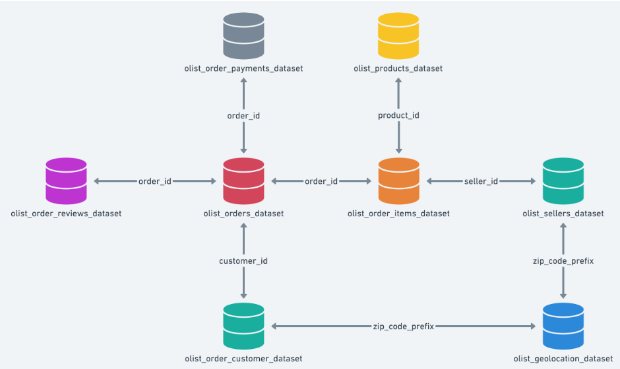


Sehingga kita perlu menangani duplikat terhadap 4 tabel di atas, karena hal ini akan berpengaruh ketika kita melakukan merge data.

**Langkah selanjutnya:**
Agar kita dapat melakukan analisa secara lebih luas, maka kita akan melakukan pendekatan merging semua tables ke dalam 1 tabel yang memiliki kolom yang cukup komprehensif yang dapat menggambarkan kondisi dataset kita secara keseluruhan.

##**Merge Tables**

### Merge Customer with Geolocation

In [90]:
#gabungkan tabel customer dengan lokasi
df_merge_customer = pd.merge(df_customer,df_geolocation_agg, on='zip_code_prefix',how='left')
df_merge_customer.head(3)

,customer_id,customer_unique_id,zip_code_prefix,customer_city,customer_state,geolocation_lat,geolocation_lng,geolocation_city,geolocation_state
0,06b8999e2fba1a1fbc88172c00ba8bc7,861eff4711a542e4b93843c6dd7febb0,14409,franca,SP,-20.509897,-47.397866,franca,SP
1,18955e83d337fd6b2def6b18a428ac77,290c77bc529b7ac935b93aa66c333dc3,9790,sao bernardo do campo,SP,-23.726853,-46.545746,sao bernardo do campo,SP
2,4e7b3e00288586ebd08712fdd0374a03,060e732b5b29e8181a18229c7b0b2b5e,1151,sao paulo,SP,-23.527788,-46.660310,sao paulo,SP


In [91]:
#lihat apabila hasil customer yang lokasinya tidak ditemukan
df_merge_customer.isna().sum()

customer_id             0
customer_unique_id      0
zip_code_prefix         0
customer_city           0
customer_state          0
geolocation_lat       278
geolocation_lng       278
geolocation_city      278
geolocation_state     278
dtype: int64

### Merge Sellers with Geolocation

In [92]:
#gabungkan tabel seller dan lokasi
df_merge_sellers = pd.merge(df_sellers,df_geolocation_agg, on='zip_code_prefix',how='left')
df_merge_sellers.head(3)

,seller_id,zip_code_prefix,seller_city,seller_state,geolocation_lat,geolocation_lng,geolocation_city,geolocation_state
0,3442f8959a84dea7ee197c632cb2df15,13023,campinas,SP,-22.898536,-47.063125,campinas,SP
1,d1b65fc7debc3361ea86b5f14c68d2e2,13844,mogi guacu,SP,-22.382941,-46.946641,mogi-guacu,SP
2,ce3ad9de960102d0677a81f5d0bb7b2d,20031,rio de janeiro,RJ,-22.910641,-43.176510,rio de janeiro,RJ


In [93]:
#cek apabila ada seller yang lokasinya tidak ditemukan
df_merge_sellers.isna().sum()

seller_id            0
zip_code_prefix      0
seller_city          0
seller_state         0
geolocation_lat      7
geolocation_lng      7
geolocation_city     7
geolocation_state    7
dtype: int64

### Merge Products with Category Name

In [94]:
#gabungkan tabel produk dengan nama kategori
df_merge_products = pd.merge(df_products,df_category_name, on='product_category_name',how='left')
df_merge_products.head(3)

,product_id,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm,product_category_name_english
0,1e9e8ef04dbcff4541ed26657ea517e5,perfumaria,40.0,287.0,1.0,225.0,16.0,10.0,14.0,perfumery
1,3aa071139cb16b67ca9e5dea641aaa2f,artes,44.0,276.0,1.0,1000.0,30.0,18.0,20.0,art
2,96bd76ec8810374ed1b65e291975717f,esporte_lazer,46.0,250.0,1.0,154.0,18.0,9.0,15.0,sports_leisure


In [95]:
#lihat apabila hasil penggabungan menghasilkan null values
df_merge_products.isna().sum()

product_id                         0
product_category_name              0
product_name_lenght                0
product_description_lenght         0
product_photos_qty                 0
product_weight_g                   0
product_length_cm                  0
product_height_cm                  0
product_width_cm                   0
product_category_name_english    623
dtype: int64

### Merge Order Items with Products and Sellers

In [96]:
#gabungkan tabel produk dan seller
df_merge_items = pd.merge(df_items_agg,df_merge_products, on='product_id',how='left')
df_merge_items = pd.merge(df_merge_items,df_merge_sellers, on='seller_id',how='left')
df_merge_items.head(3)

,order_id,seller_id,product_id,shipping_limit_date,price,freight_value,Quantity,Total Price,Total Freight,item_id,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm,product_category_name_english,zip_code_prefix,seller_city,seller_state,geolocation_lat,geolocation_lng,geolocation_city,geolocation_state
0,1b15974a0141d54e36626dca3fdc731a,8e6d7754bc7e0f22c96d255ebda59eba,ee3d532c8a438679776d222e997606b3,2018-03-01 02:50:48,100.00,10.12,20,2000.00,202.4,1b15974a0141d54e36626dca3fdc731a_8e6d7754bc7e0...,informatica_acessorios,43.0,452.0,1.0,360.0,19.0,18.0,15.0,computers_accessories,12233,sao jose dos campos,SP,-23.237250,-45.880830,sao jose dos campos,SP
1,ab14fdcfbe524636d65ee38360e22ce8,ce27a3cc3c8cc1ea79d11e561e9bebb6,9571759451b1d780ee7c15012ea109d4,2017-08-30 14:30:23,98.70,14.44,20,1974.00,288.8,ab14fdcfbe524636d65ee38360e22ce8_ce27a3cc3c8cc...,automotivo,39.0,1042.0,1.0,1400.0,20.0,31.0,30.0,auto,3006,sao paulo,SP,-23.543136,-46.623716,sao paulo,SP
2,428a2f660dc84138d969ccd69a0ab6d5,f326006815956455b2859abd58fe7e39,89b190a046022486c635022524a974a8,2017-11-30 10:30:51,65.49,16.22,15,982.35,243.3,428a2f660dc84138d969ccd69a0ab6d5_f326006815956...,moveis_decoracao,59.0,1744.0,2.0,700.0,62.0,15.0,15.0,furniture_decor,15601,fernandopolis,SP,-20.298113,-50.253317,fernandopolis,SP


In [998]:
#lihat apabila penggabungan menghasilkan null values
df_merge_items.isna().sum()

order_id                            0
seller_id                           0
product_id                          0
shipping_limit_date                 0
price                               0
freight_value                       0
Quantity                            0
Total Price                         0
Total Freight                       0
item_id                             0
product_category_name               0
product_name_lenght                 0
product_description_lenght          0
product_photos_qty                  0
product_weight_g                    0
product_length_cm                   0
product_height_cm                   0
product_width_cm                    0
product_category_name_english    1482
zip_code_prefix                     0
seller_city                         0
seller_state                        0
geolocation_lat                   225
geolocation_lng                   225
geolocation_city                  225
geolocation_state                 225
dtype: int64

### Merge Orders with Customers, Order Reviews and Order Payments

In [999]:
#gabungkan 3 tabel
df_merge_orders = pd.merge(df_order,df_reviews, on='order_id',how='left')
df_merge_orders = pd.merge(df_merge_orders,df_payments_agg, on='order_id',how='left')
df_merge_orders = pd.merge(df_merge_orders,df_customer, on='customer_id',how='left')
df_merge_orders.head(3)

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,review_id,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp,Tenure,Total Payments,payment_type,customer_unique_id,zip_code_prefix,customer_city,customer_state
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18 00:00:00,a54f0611adc9ed256b57ede6b6eb5114,4.0,-,"Não testei o produto ainda, mas ele veio corre...",2017-10-11 00:00:00,2017-10-12 03:43:48,3.0,38.71,credit_card,7c396fd4830fd04220f754e42b4e5bff,3149,sao paulo,SP
1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13 00:00:00,8d5266042046a06655c8db133d120ba5,4.0,Muito boa a loja,Muito bom o produto.,2018-08-08 00:00:00,2018-08-08 18:37:50,1.0,141.46,boleto,af07308b275d755c9edb36a90c618231,47813,barreiras,BA
2,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,delivered,2018-08-08 08:38:49,2018-08-08 08:55:23,2018-08-08 13:50:00,2018-08-17 18:06:29,2018-09-04 00:00:00,e73b67b67587f7644d5bd1a52deb1b01,5.0,-,-,2018-08-18 00:00:00,2018-08-22 19:07:58,1.0,179.12,credit_card,3a653a41f6f9fc3d2a113cf8398680e8,75265,vianopolis,GO


In [1000]:
#cek null values
df_merge_orders.isna().sum()

order_id                           0
customer_id                        0
order_status                       0
order_purchase_timestamp           0
order_approved_at                  0
order_delivered_carrier_date       0
order_delivered_customer_date      0
order_estimated_delivery_date      0
review_id                        768
review_score                     768
review_comment_title             768
review_comment_message           768
review_creation_date             768
review_answer_timestamp          768
Tenure                             1
Total Payments                     1
payment_type                       1
customer_unique_id                 0
zip_code_prefix                    0
customer_city                      0
customer_state                     0
dtype: int64

### Merge All tables

In [1001]:
#gabungkan semua tabel secara keseluruhan
df_merge_all = pd.merge(df_merge_orders,df_merge_items, on='order_id',how='left')
df_merge_all.head(3)

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,review_id,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp,Tenure,Total Payments,payment_type,customer_unique_id,zip_code_prefix_x,customer_city,customer_state,seller_id,product_id,shipping_limit_date,price,freight_value,Quantity,Total Price,Total Freight,item_id,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm,product_category_name_english,zip_code_prefix_y,seller_city,seller_state,geolocation_lat,geolocation_lng,geolocation_city,geolocation_state
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18 00:00:00,a54f0611adc9ed256b57ede6b6eb5114,4.0,-,"Não testei o produto ainda, mas ele veio corre...",2017-10-11 00:00:00,2017-10-12 03:43:48,3.0,38.71,credit_card,7c396fd4830fd04220f754e42b4e5bff,3149,sao paulo,SP,3504c0cb71d7fa48d967e0e4c94d59d9,87285b34884572647811a353c7ac498a,2017-10-06 11:07:15,29.99,8.72,1.0,29.99,8.72,e481f51cbdc54678b7cc49136f2d6af7_3504c0cb71d7f...,utilidades_domesticas,40.0,268.0,4.0,500.0,19.0,8.0,13.0,housewares,9350.0,maua,SP,-23.680114,-46.452454,maua,SP
1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13 00:00:00,8d5266042046a06655c8db133d120ba5,4.0,Muito boa a loja,Muito bom o produto.,2018-08-08 00:00:00,2018-08-08 18:37:50,1.0,141.46,boleto,af07308b275d755c9edb36a90c618231,47813,barreiras,BA,289cdb325fb7e7f891c38608bf9e0962,595fac2a385ac33a80bd5114aec74eb8,2018-07-30 03:24:27,118.70,22.76,1.0,118.70,22.76,53cdb2fc8bc7dce0b6741e2150273451_289cdb325fb7e...,perfumaria,29.0,178.0,1.0,400.0,19.0,13.0,19.0,perfumery,31570.0,belo horizonte,SP,-19.810119,-43.984727,belo horizonte,MG
2,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,delivered,2018-08-08 08:38:49,2018-08-08 08:55:23,2018-08-08 13:50:00,2018-08-17 18:06:29,2018-09-04 00:00:00,e73b67b67587f7644d5bd1a52deb1b01,5.0,-,-,2018-08-18 00:00:00,2018-08-22 19:07:58,1.0,179.12,credit_card,3a653a41f6f9fc3d2a113cf8398680e8,75265,vianopolis,GO,4869f7a5dfa277a7dca6462dcf3b52b2,aa4383b373c6aca5d8797843e5594415,2018-08-13 08:55:23,159.90,19.22,1.0,159.90,19.22,47770eb9100c2d0c44946d9cf07ec65d_4869f7a5dfa27...,automotivo,46.0,232.0,1.0,420.0,24.0,19.0,21.0,auto,14840.0,guariba,SP,-21.362358,-48.232976,guariba,SP


In [1002]:
#lihat jumlah baris dan kolom pada tabel
df_merge_all.shape

(103200, 46)

In [1003]:
#cek kolom pada tabel
df_merge_all.isna().sum()

order_id                            0
customer_id                         0
order_status                        0
order_purchase_timestamp            0
order_approved_at                   0
order_delivered_carrier_date        0
order_delivered_customer_date       0
order_estimated_delivery_date       0
review_id                         816
review_score                      816
review_comment_title              816
review_comment_message            816
review_creation_date              816
review_answer_timestamp           816
Tenure                              1
Total Payments                      1
payment_type                        1
customer_unique_id                  0
zip_code_prefix_x                   0
customer_city                       0
customer_state                      0
seller_id                         775
product_id                        775
shipping_limit_date               775
price                             775
freight_value                     775
Quantity    

In [1004]:
#buang kolom kolom yang tidak doperlukan
df_merge_all.drop(columns=['review_id','customer_unique_id'],inplace=True)
df_merge_all.drop(columns={'zip_code_prefix_x':'zip_code_customer','zip_code_prefix_y':'zip_code_seller'},inplace=True)
df_merge_all.head(3)

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp,Tenure,Total Payments,payment_type,customer_city,customer_state,seller_id,product_id,shipping_limit_date,price,freight_value,Quantity,Total Price,Total Freight,item_id,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm,product_category_name_english,seller_city,seller_state,geolocation_lat,geolocation_lng,geolocation_city,geolocation_state
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18 00:00:00,4.0,-,"Não testei o produto ainda, mas ele veio corre...",2017-10-11 00:00:00,2017-10-12 03:43:48,3.0,38.71,credit_card,sao paulo,SP,3504c0cb71d7fa48d967e0e4c94d59d9,87285b34884572647811a353c7ac498a,2017-10-06 11:07:15,29.99,8.72,1.0,29.99,8.72,e481f51cbdc54678b7cc49136f2d6af7_3504c0cb71d7f...,utilidades_domesticas,40.0,268.0,4.0,500.0,19.0,8.0,13.0,housewares,maua,SP,-23.680114,-46.452454,maua,SP
1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13 00:00:00,4.0,Muito boa a loja,Muito bom o produto.,2018-08-08 00:00:00,2018-08-08 18:37:50,1.0,141.46,boleto,barreiras,BA,289cdb325fb7e7f891c38608bf9e0962,595fac2a385ac33a80bd5114aec74eb8,2018-07-30 03:24:27,118.70,22.76,1.0,118.70,22.76,53cdb2fc8bc7dce0b6741e2150273451_289cdb325fb7e...,perfumaria,29.0,178.0,1.0,400.0,19.0,13.0,19.0,perfumery,belo horizonte,SP,-19.810119,-43.984727,belo horizonte,MG
2,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,delivered,2018-08-08 08:38:49,2018-08-08 08:55:23,2018-08-08 13:50:00,2018-08-17 18:06:29,2018-09-04 00:00:00,5.0,-,-,2018-08-18 00:00:00,2018-08-22 19:07:58,1.0,179.12,credit_card,vianopolis,GO,4869f7a5dfa277a7dca6462dcf3b52b2,aa4383b373c6aca5d8797843e5594415,2018-08-13 08:55:23,159.90,19.22,1.0,159.90,19.22,47770eb9100c2d0c44946d9cf07ec65d_4869f7a5dfa27...,automotivo,46.0,232.0,1.0,420.0,24.0,19.0,21.0,auto,guariba,SP,-21.362358,-48.232976,guariba,SP


In [1005]:
#simpan ke dalam csv
df_merge_all.to_csv('/content/drive/MyDrive/tugas_pacmann/cleaned_data.csv',index=False)

## **Cleaning Data**

In [1006]:
#buat dataframe
df_merge_all = pd.read_csv('/content/drive/MyDrive/tugas_pacmann/cleaned_data.csv', low_memory=False)
df_merge_all.head(3)

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp,Tenure,Total Payments,payment_type,customer_city,customer_state,seller_id,product_id,shipping_limit_date,price,freight_value,Quantity,Total Price,Total Freight,item_id,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm,product_category_name_english,seller_city,seller_state,geolocation_lat,geolocation_lng,geolocation_city,geolocation_state
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18 00:00:00,4.0,-,"Não testei o produto ainda, mas ele veio corre...",2017-10-11 00:00:00,2017-10-12 03:43:48,3.0,38.71,credit_card,sao paulo,SP,3504c0cb71d7fa48d967e0e4c94d59d9,87285b34884572647811a353c7ac498a,2017-10-06 11:07:15,29.99,8.72,1.0,29.99,8.72,e481f51cbdc54678b7cc49136f2d6af7_3504c0cb71d7f...,utilidades_domesticas,40.0,268.0,4.0,500.0,19.0,8.0,13.0,housewares,maua,SP,-23.680114,-46.452454,maua,SP
1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13 00:00:00,4.0,Muito boa a loja,Muito bom o produto.,2018-08-08 00:00:00,2018-08-08 18:37:50,1.0,141.46,boleto,barreiras,BA,289cdb325fb7e7f891c38608bf9e0962,595fac2a385ac33a80bd5114aec74eb8,2018-07-30 03:24:27,118.70,22.76,1.0,118.70,22.76,53cdb2fc8bc7dce0b6741e2150273451_289cdb325fb7e...,perfumaria,29.0,178.0,1.0,400.0,19.0,13.0,19.0,perfumery,belo horizonte,SP,-19.810119,-43.984727,belo horizonte,MG
2,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,delivered,2018-08-08 08:38:49,2018-08-08 08:55:23,2018-08-08 13:50:00,2018-08-17 18:06:29,2018-09-04 00:00:00,5.0,-,-,2018-08-18 00:00:00,2018-08-22 19:07:58,1.0,179.12,credit_card,vianopolis,GO,4869f7a5dfa277a7dca6462dcf3b52b2,aa4383b373c6aca5d8797843e5594415,2018-08-13 08:55:23,159.90,19.22,1.0,159.90,19.22,47770eb9100c2d0c44946d9cf07ec65d_4869f7a5dfa27...,automotivo,46.0,232.0,1.0,420.0,24.0,19.0,21.0,auto,guariba,SP,-21.362358,-48.232976,guariba,SP


In [1007]:
#cek jumlah nilai unik pada kolom
df_merge_all['item_id'].nunique()

102425

In [1008]:
#buang baris yang item_id nya duplikat
df_merge_all.drop_duplicates(subset='item_id').shape

(102426, 42)

In [1009]:
#cek bentuk df_merge_all
df_merge_all.shape

(103200, 42)

In [1010]:
#lihat apabila ada duplikasi
df_merge_all['item_id'].value_counts().head(10)

e481f51cbdc54678b7cc49136f2d6af7_3504c0cb71d7fa48d967e0e4c94d59d9_87285b34884572647811a353c7ac498a    1
59c1736899bb709593b369f89fbf2574_4e922959ae960d389249c378d1c939f5_754d489a7a6c5b5f63c6e1ea42f9125f    1
bb645512c737c47f7bb875b67153b3f4_70c27847eca8195c983ed7e798c56743_ba80c9f47a84d1e08465f72e22930c83    1
acd8818cd21fdfa62f891ceb60326435_6039e27294dc75811c0d8a39069f52c0_e940125d0a3c309f58f41cd21e39af06    1
da0686c22c00de36d95422798bdd9cde_4371b634e0efc0e22b09b52907d9d469_2d0090282bd77e1ae0f6336ba500facf    1
e0b4e92a39bc8b93bc4ff121772819ea_2c3d56f92f360fb89d849b84e8f50eae_64eb8b21706b8e2c733ba16bf02a1537    1
e18d0e097ef9cdd7894ed1b82a2b7479_c42fd8e4d47dfb18ce5222f2dd7752f9_41171e11f920c47deb1809edda2bf09d    1
f01059d0d674e1282df4e8fbbe015aa2_7299e27ed73d2ad986de7f7c77d919fa_c7dc39bcc7f9bf8a9b253b8727a0cde5    1
40f27de71845c6aebc742107208b5c2b_6560211a19b47992c3666cc44a7e94c0_12667a519a4a3094eab02f5841b07409    1
40f27de71845c6aebc742107208b5c2b_6560211a19b47992c3666cc44a7e94c

In [1011]:
#buang baris yang item_id nya tidak ditemukan
df_merge_all.dropna(subset=['item_id'],inplace=True)

In [1012]:
#cek kembali bentuk sesudah data dibersihkan
df_merge_all.shape

(102425, 42)

In [1013]:
#isi fillna terhadap tabel keseluruhan
df_merge_all['geolocation_lat'].fillna(df_merge_all['geolocation_lat'].mean(), inplace=True)
df_merge_all['geolocation_lng'].fillna(df_merge_all['geolocation_lng'].mean(), inplace=True)
df_merge_all['geolocation_city'].fillna("-", inplace=True)
df_merge_all['geolocation_state'].fillna("-", inplace=True)
df_merge_all['product_category_name_english'].fillna("-", inplace=True)
df_merge_all['Tenure'].fillna(0, inplace=True)
df_merge_all['Total Payments'].fillna(0, inplace=True)
df_merge_all['review_score'].fillna(0, inplace=True)
df_merge_all['review_comment_title'].fillna("-", inplace=True)
df_merge_all['review_comment_message'].fillna("-", inplace=True)
df_merge_all['payment_type'].fillna("-", inplace=True)

In [1014]:
#membersihkan format kolom
df_merge_all['product_category_name_english'] = df_merge_all['product_category_name_english'].str.replace('_',', ')
df_merge_all['product_category_name_english'] = df_merge_all['product_category_name_english'].astype(str).apply(lambda x: x.strip())
df_merge_all['product_category_name'] = df_merge_all['product_category_name'].str.replace('_',', ')
df_merge_all['product_category_name'] = df_merge_all['product_category_name'].astype(str).apply(lambda x: x.strip())

In [1015]:
#cek hasil cleaning
df_merge_all['product_category_name'].value_counts().head(10)

cama, mesa, banho          10160
beleza, saude               9022
esporte, lazer              7858
informatica, acessorios     6887
moveis, decoracao           6781
utilidades, domesticas      6019
relogios, presentes         5799
telefonia                   4287
automotivo                  3991
brinquedos                  3979
Name: product_category_name, dtype: int64

In [1016]:
#simpan kembali data ke drive
df_merge_all.to_csv('/content/drive/MyDrive/tugas_pacmann/cleaned_data.csv',index=False)

## **Analisa Data**

In [102]:
#import library chart

import seaborn as sns
import matplotlib.pyplot as plt

In [98]:
#buat kembali dataframe
df_merge_all = pd.read_csv('/content/drive/MyDrive/tugas_pacmann/cleaned_data.csv', low_memory=False)
df_merge_all.head(10)

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp,Tenure,Total Payments,payment_type,customer_city,customer_state,seller_id,product_id,shipping_limit_date,price,freight_value,Quantity,Total Price,Total Freight,item_id,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm,product_category_name_english,seller_city,seller_state,geolocation_lat,geolocation_lng,geolocation_city,geolocation_state
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18 00:00:00,4.0,-,"Não testei o produto ainda, mas ele veio corre...",2017-10-11 00:00:00,2017-10-12 03:43:48,3.0,38.71,credit_card,sao paulo,SP,3504c0cb71d7fa48d967e0e4c94d59d9,87285b34884572647811a353c7ac498a,2017-10-06 11:07:15,29.99,8.72,1.0,29.99,8.72,e481f51cbdc54678b7cc49136f2d6af7_3504c0cb71d7f...,"utilidades, domesticas",40.0,268.0,4.0,500.0,19.0,8.0,13.0,housewares,maua,SP,-23.680114,-46.452454,maua,SP
1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13 00:00:00,4.0,Muito boa a loja,Muito bom o produto.,2018-08-08 00:00:00,2018-08-08 18:37:50,1.0,141.46,boleto,barreiras,BA,289cdb325fb7e7f891c38608bf9e0962,595fac2a385ac33a80bd5114aec74eb8,2018-07-30 03:24:27,118.70,22.76,1.0,118.70,22.76,53cdb2fc8bc7dce0b6741e2150273451_289cdb325fb7e...,perfumaria,29.0,178.0,1.0,400.0,19.0,13.0,19.0,perfumery,belo horizonte,SP,-19.810119,-43.984727,belo horizonte,MG
2,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,delivered,2018-08-08 08:38:49,2018-08-08 08:55:23,2018-08-08 13:50:00,2018-08-17 18:06:29,2018-09-04 00:00:00,5.0,-,-,2018-08-18 00:00:00,2018-08-22 19:07:58,1.0,179.12,credit_card,vianopolis,GO,4869f7a5dfa277a7dca6462dcf3b52b2,aa4383b373c6aca5d8797843e5594415,2018-08-13 08:55:23,159.90,19.22,1.0,159.90,19.22,47770eb9100c2d0c44946d9cf07ec65d_4869f7a5dfa27...,automotivo,46.0,232.0,1.0,420.0,24.0,19.0,21.0,auto,guariba,SP,-21.362358,-48.232976,guariba,SP
3,949d5b44dbf5de918fe9c16f97b45f8a,f88197465ea7920adcdbec7375364d82,delivered,2017-11-18 19:28:06,2017-11-18 19:45:59,2017-11-22 13:39:59,2017-12-02 00:28:42,2017-12-15 00:00:00,5.0,-,O produto foi exatamente o que eu esperava e e...,2017-12-03 00:00:00,2017-12-05 19:21:58,1.0,72.20,credit_card,sao goncalo do amarante,RN,66922902710d126a0e7d26b0e3805106,d0b61bfb1de832b15ba9d266ca96e5b0,2017-11-23 19:45:59,45.00,27.20,1.0,45.00,27.20,949d5b44dbf5de918fe9c16f97b45f8a_66922902710d1...,"pet, shop",59.0,468.0,3.0,450.0,30.0,10.0,20.0,"pet, shop",belo horizonte,MG,-19.840168,-43.923299,belo horizonte,MG
4,ad21c59c0840e6cb83a9ceb5573f8159,8ab97904e6daea8866dbdbc4fb7aad2c,delivered,2018-02-13 21:18:39,2018-02-13 22:20:29,2018-02-14 19:46:34,2018-02-16 18:17:02,2018-02-26 00:00:00,5.0,-,-,2018-02-17 00:00:00,2018-02-18 13:02:51,1.0,28.62,credit_card,santo andre,SP,2c9e548be18521d1c43cde1c582c6de8,65266b2da20d04dbe00c5c2d3bb7859e,2018-02-19 20:31:37,19.90,8.72,1.0,19.90,8.72,ad21c59c0840e6cb83a9ceb5573f8159_2c9e548be1852...,papelaria,38.0,316.0,4.0,250.0,51.0,15.0,15.0,stationery,mogi das cruzes,SP,-23.551707,-46.260979,mogi das cruzes,SP
5,a4591c265e18cb1dcee52889e2d8acc3,503740e9ca751ccdda7ba28e9ab8f608,delivered,2017-07-09 21:57:05,2017-07-09 22:10:13,2017-07-11 14:58:04,2017-07-26 10:57:55,2017-08-01 00:00:00,4.0,-,-,2017-07-27 00:00:00,2017-07-27 22:48:30,1.0,175.26,credit_card,congonhinhas,PR,8581055ce74af1daba164fdbd55a40de,060cb19345d90064d1015407193c233d,2017-07-13 22:10:13,147.90,27.36,1.0,147.90,27.36,a4591c265e18cb1dcee52889e2d8acc3_8581055ce74af...,automotivo,49.0,608.0,1.0,

In [99]:
#konversi kolom ke format yang sesuai
df_merge_all['order_delivered_carrier_date'] = df_merge_all['order_delivered_carrier_date'].apply(convert_to_date)
df_merge_all['order_delivered_customer_date'] = df_merge_all['order_delivered_customer_date'].apply(convert_to_date)
df_merge_all['order_delivered_customer_date'] = df_merge_all['order_delivered_customer_date'].apply(convert_to_date)
df_merge_all['order_estimated_delivery_date'] = df_merge_all['order_estimated_delivery_date'].apply(convert_to_date)
df_merge_all['order_approved_at'] = df_merge_all['order_approved_at'].apply(convert_to_date)
df_merge_all['order_purchase_timestamp'] = df_merge_all['order_purchase_timestamp'].apply(convert_to_date)
df_merge_all['review_creation_date'] = df_merge_all['review_creation_date'].apply(convert_to_date)
df_merge_all['review_answer_timestamp'] = df_merge_all['review_answer_timestamp'].apply(convert_to_date)
df_merge_all['shipping_limit_date'] = df_merge_all['shipping_limit_date'].apply(convert_to_date)
df_merge_all['product_weight_g'] = df_merge_all['product_weight_g'].astype(float)
df_merge_all['product_length_cm'] = df_merge_all['product_length_cm'].astype(float)
df_merge_all['product_height_cm'] = df_merge_all['product_height_cm'].astype(float)
df_merge_all['product_width_cm'] = df_merge_all['product_width_cm'].astype(float)

In [100]:
#kelompokkan baris berdasarkan bulan, tahun dan urutan bulan
df_merge_all['purchase_year'] = df_merge_all['order_purchase_timestamp'].dt.year
df_merge_all['purchase_month'] = df_merge_all['order_purchase_timestamp'].dt.month
df_merge_all['purchase_month_order'] = df_merge_all['order_purchase_timestamp'].dt.month + (df_merge_all['purchase_year'] - df_merge_all['purchase_year'].min()) * 12

In [1020]:
#cek format tabel
df_merge_all.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 102425 entries, 0 to 102424
Data columns (total 45 columns):
 #   Column                         Non-Null Count   Dtype         
---  ------                         --------------   -----         
 0   order_id                       102425 non-null  object        
 1   customer_id                    102425 non-null  object        
 2   order_status                   102425 non-null  object        
 3   order_purchase_timestamp       102425 non-null  datetime64[ns]
 4   order_approved_at              102425 non-null  datetime64[ns]
 5   order_delivered_carrier_date   102425 non-null  datetime64[ns]
 6   order_delivered_customer_date  102425 non-null  datetime64[ns]
 7   order_estimated_delivery_date  102425 non-null  datetime64[ns]
 8   review_score                   102425 non-null  float64       
 9   review_comment_title           102425 non-null  object        
 10  review_comment_message         102425 non-null  object        
 11  

In [1021]:
#cek null values
df_merge_all.isna().sum()

order_id                           0
customer_id                        0
order_status                       0
order_purchase_timestamp           0
order_approved_at                  0
order_delivered_carrier_date       0
order_delivered_customer_date      0
order_estimated_delivery_date      0
review_score                       0
review_comment_title               0
review_comment_message             0
review_creation_date             797
review_answer_timestamp          797
Tenure                             0
Total Payments                     0
payment_type                       0
customer_city                      0
customer_state                     0
seller_id                          0
product_id                         0
shipping_limit_date                0
price                              0
freight_value                      0
Quantity                           0
Total Price                        0
Total Freight                      0
item_id                            0
p

In [1025]:
#cek statistika deskriptif untuk lihat outliers
describe_non_numeric = df_merge_all.describe(include='object')
describe_numeric = df_merge_all.describe(include='float')
l = describe_numeric.loc['75%']-describe_numeric.loc['25%']
describe_numeric.loc['batas_bawah']=describe_numeric.loc['25%']-1.5*l
describe_numeric.loc['batas_atas']=describe_numeric.loc['75%']+1.5*l
display(describe_non_numeric, describe_numeric)

,order_id,customer_id,order_status,review_comment_title,review_comment_message,payment_type,customer_city,customer_state,seller_id,product_id,item_id,product_category_name,product_category_name_english,seller_city,seller_state,geolocation_city,geolocation_state
count,102425,102425,102425,102425,102425,102425,102425,102425,102425,102425,102425,102425,102425,102425,102425,102425,102425
unique,98666,98666,7,4495,35593,5,4110,27,3095,32951,102425,74,72,611,23,596,23
top,ca3625898fbd48669d50701aba51cd5f,0d861a5e4dd6a9079d89e1330848f0ab,delivered,-,-,credit_card,sao paulo,SP,6560211a19b47992c3666cc44a7e94c0,99a4788cb24856965c36a24e339b6058,e481f51cbdc54678b7cc49136f2d6af7_3504c0cb71d7f...,"cama, mesa, banho","bed, bath, table",sao paulo,SP,sao paulo,SP
freq,8,8,100196,90392,60091,77815,16076,43052,1982,467,1,10160,10160,25249,72818,21058,72095


,review_score,Tenure,Total Payments,price,freight_value,Quantity,Total Price,Total Freight,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm,geolocation_lat,geolocation_lng
count,102425.000000,102425.000000,102425.000000,102425.000000,102425.000000,102425.000000,102425.000000,102425.000000,102425.000000,102425.000000,102425.000000,102425.000000,102425.000000,102425.000000,102425.000000,102425.000000,102425.000000
mean,4.044969,1.044901,164.346526,124.422006,20.111152,1.099829,132.698498,21.985936,48.178189,776.041884,2.207986,2090.589846,30.080586,16.406659,23.035929,-22.796149,-47.231872
std,1.395242,0.384019,222.973821,188.926084,15.884700,0.456926,205.308847,20.464659,11.492982,652.639693,1.751190,3750.760205,16.100615,13.311285,11.749644,2.727012,2.341061
min,0.000000,0.000000,0.000000,0.850000,0.000000,1.000000,0.850000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-36.605374,-67.809656
25%,4.000000,1.000000,63.100000,40.000000,13.140000,1.000000,44.900000,13.520000,42.000000,341.000000,1.000000,300.000000,18.000000,8.000000,15.000000,-23.614118,-48.812471
50%,5.000000,1.000000,107.780000,78.800000,16.320000,1.000000,81.000000,16.850000,52.000000,595.000000,1.000000,700.000000,25.000000,13.000000,20.000000,-23.418486,-46.755211
75%,5.000000,1.000000,182.300000,139.000000,21.220000,1.000000,147.900000,23.260000,57.000000,982.000000,3.000000,1800.000000,38.000000,20.000000,30.000000,-21.766477,-46.518082
max,5.000000,29.000000,13664.080000,6735.000000,409.680000,20.000000,13440.000000,1794.960000,76.000000,3992.000000,20.000000,40425.000000,105.000000,105.000000,118.000000,-2.546079,-34.847856
batas_bawah,2.500000,1.000000,-115.700000,-108.500000,1.020000,1.000000,-109.600000,-1.090000,19.500000,-620.500000,-2.000000,-1950.000000,-12.000000,-10.000000,-7.500000,-26.385580,-52.254056
batas_atas,6.500000,1.000000,361.100000,287.500000,33.340000,1.000000,302.400000,37.870000,79.500000,1943.500000,6.000000,4050.000000,68.000000,38.000000,52.500000,-18.995015,-43.076498


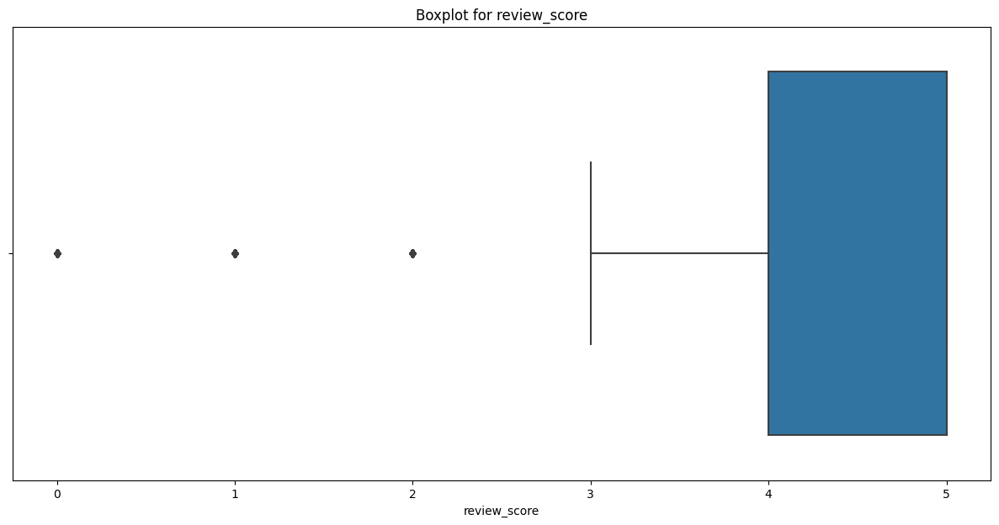

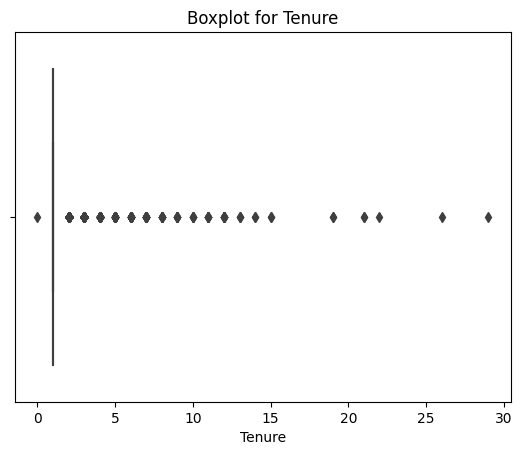

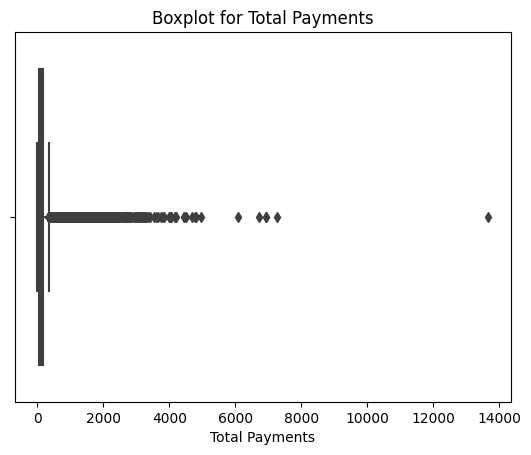

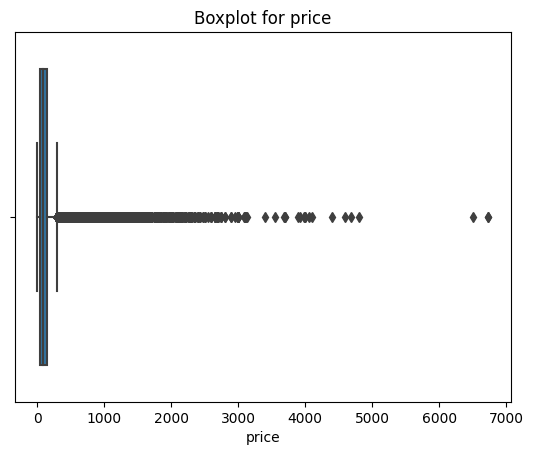

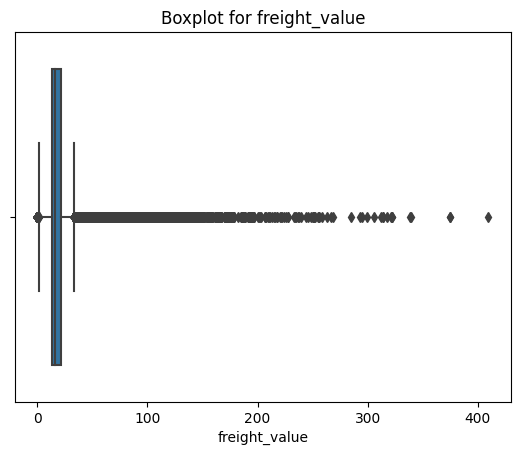

...

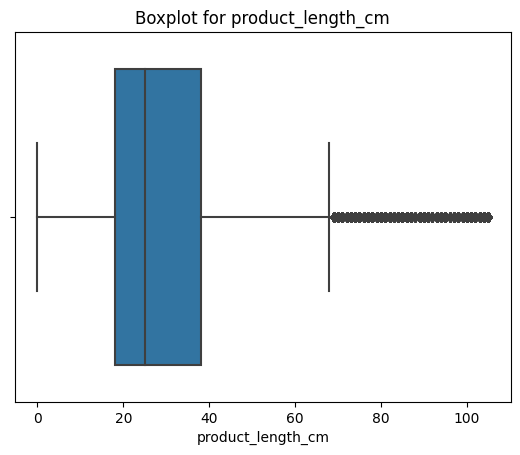

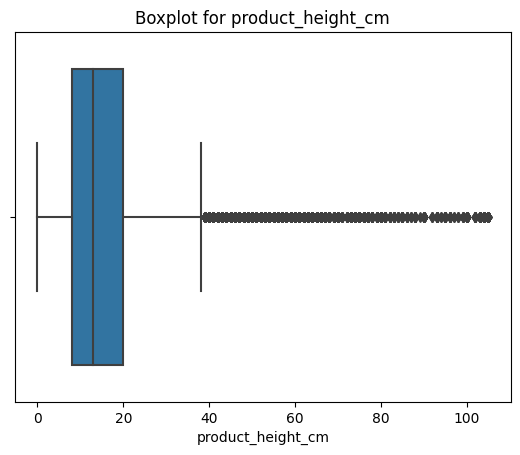

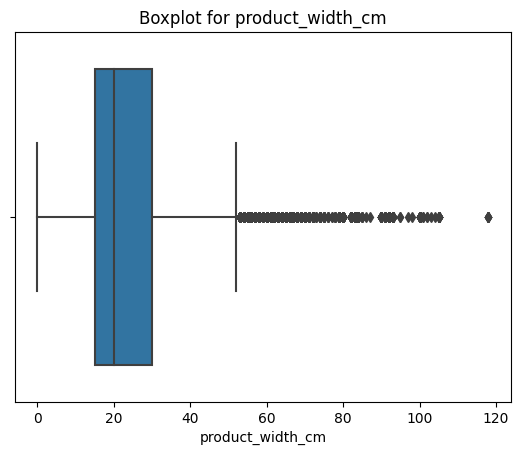

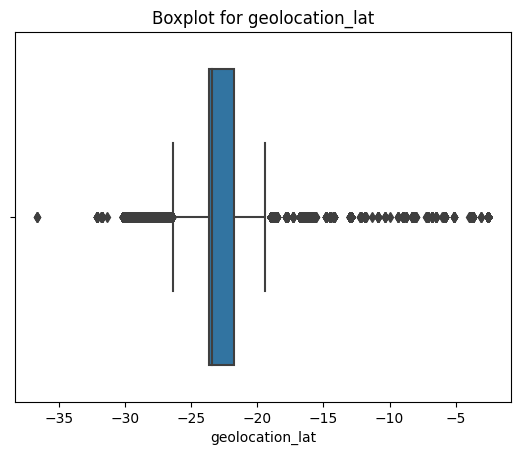

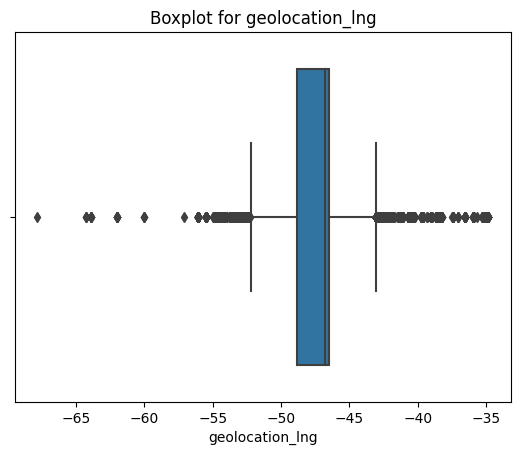

In [1026]:
#cek distribusi data untuk tiap kolom numerik
plt.figure(figsize=(15,7))

for col in df_merge_all.columns:
    if df_merge_all[col].dtype == 'float64':  # Check if the data type is float
        sns.boxplot(x=df_merge_all[col])
        plt.title(f'Boxplot for {col}')
        plt.show()


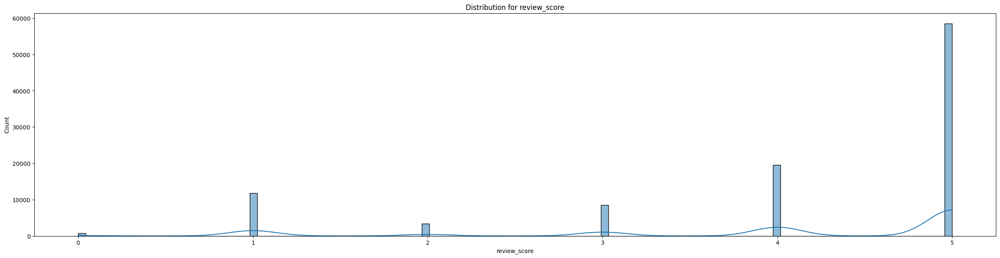

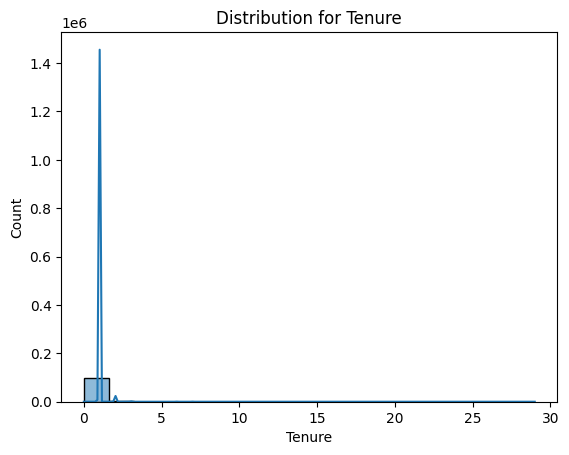

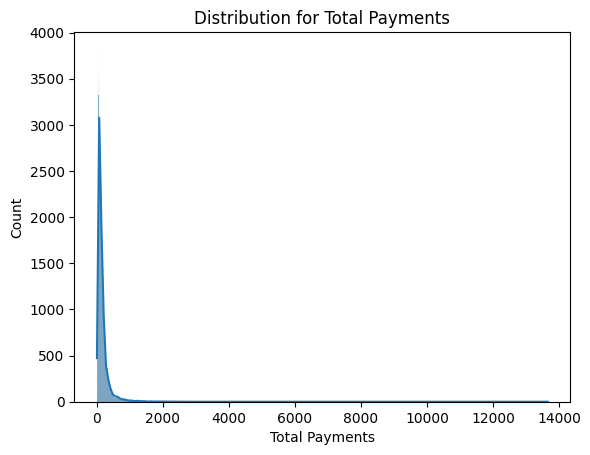

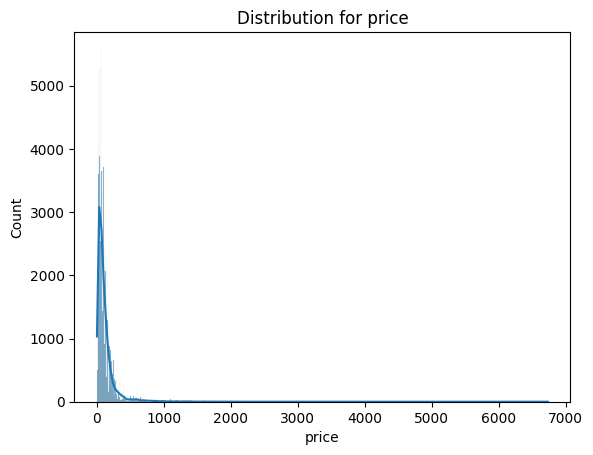

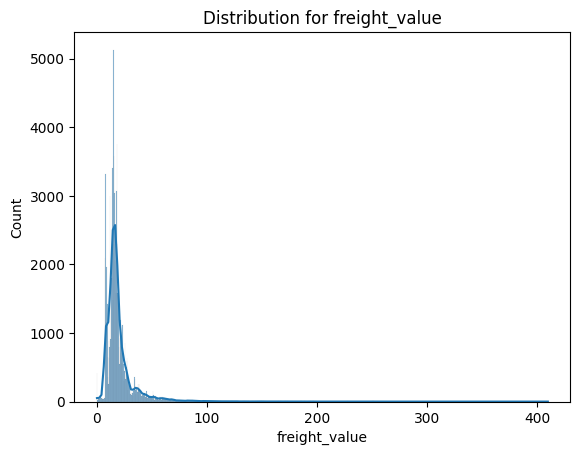

...

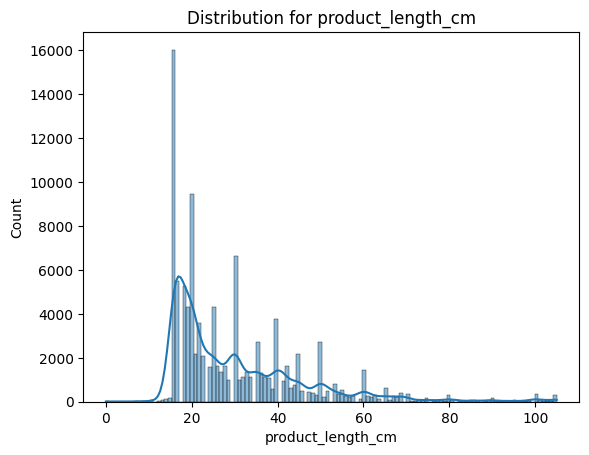

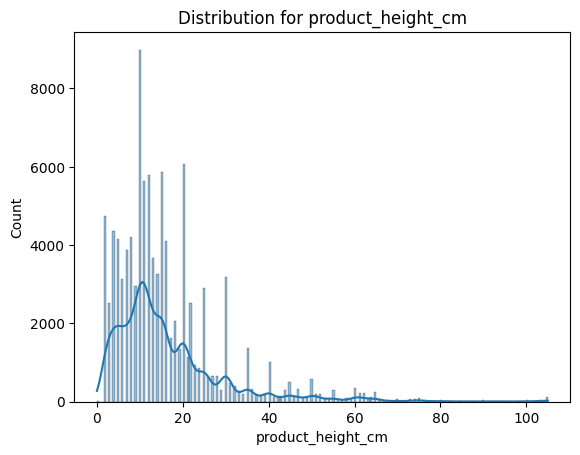

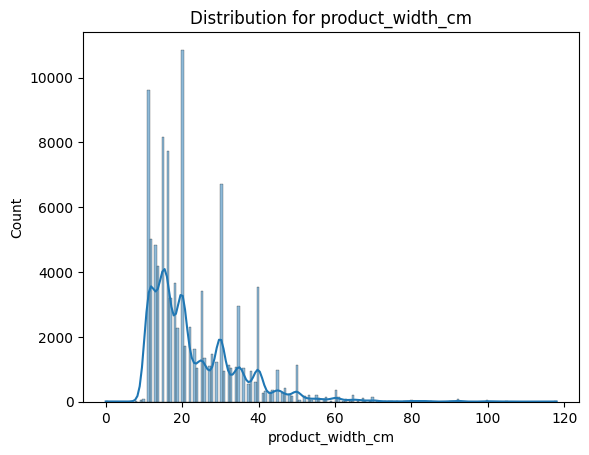

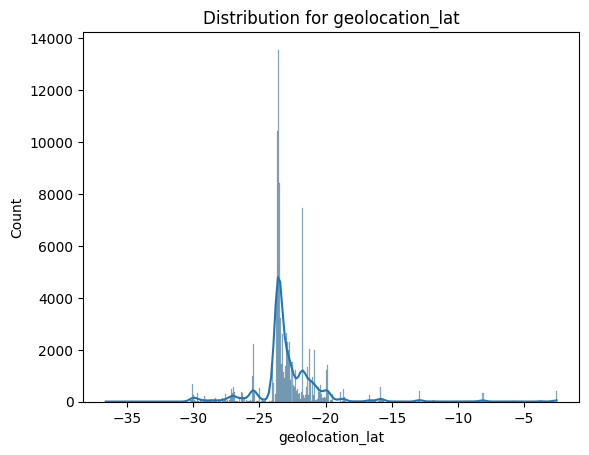

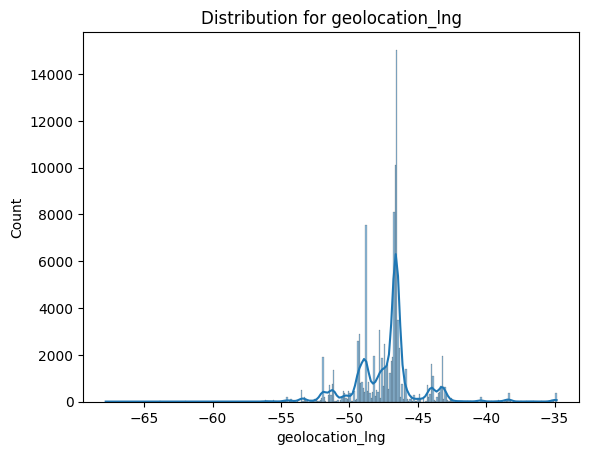

In [1027]:
#cek distribusi data untuk tiap kolom numerik
plt.figure(figsize=(30,7))

for col in df_merge_all.columns:
    if df_merge_all[col].dtype == 'float64':  # Check if the data type is float
        sns.histplot(x=df_merge_all[col], kde=True)
        plt.title(f'Distribution for {col}')
        plt.show()

In [1073]:
#pilih kolom yang akan dibuat barchart
object_columns_list = df_merge_all.select_dtypes(include='object').columns
list_option = ['order_status', 'customer_city','seller_city','product_category_name_english','seller_id']

# Use the boolean mask to filter the DataFrame
object_columns_list = object_columns_list[object_columns_list.isin(list_option)]

object_columns_list

Index(['order_status', 'customer_city', 'seller_id',
       'product_category_name_english', 'seller_city'],
      dtype='object')

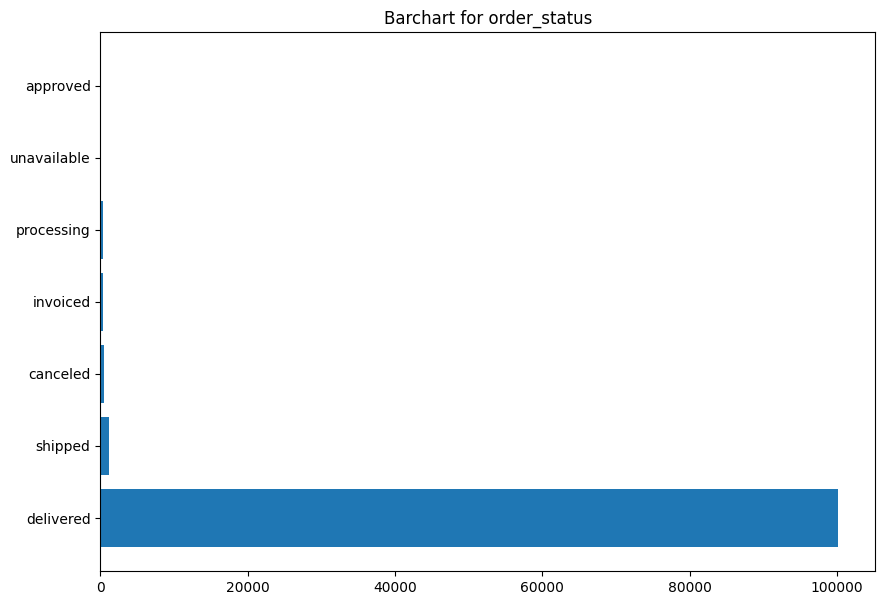

In [1074]:
#bar chart untuk order_status
plt.figure(figsize=(10,7))

for col in df_merge_all.columns:
  # Check if the data type of the column is object (string or categorical)
  if col in ['order_status']:
      value_counts = df_merge_all[col].value_counts()
      plt.barh(y=value_counts.index, width=value_counts)
      plt.title(f'Barchart for {col}')
      plt.show()

  else:
    pass

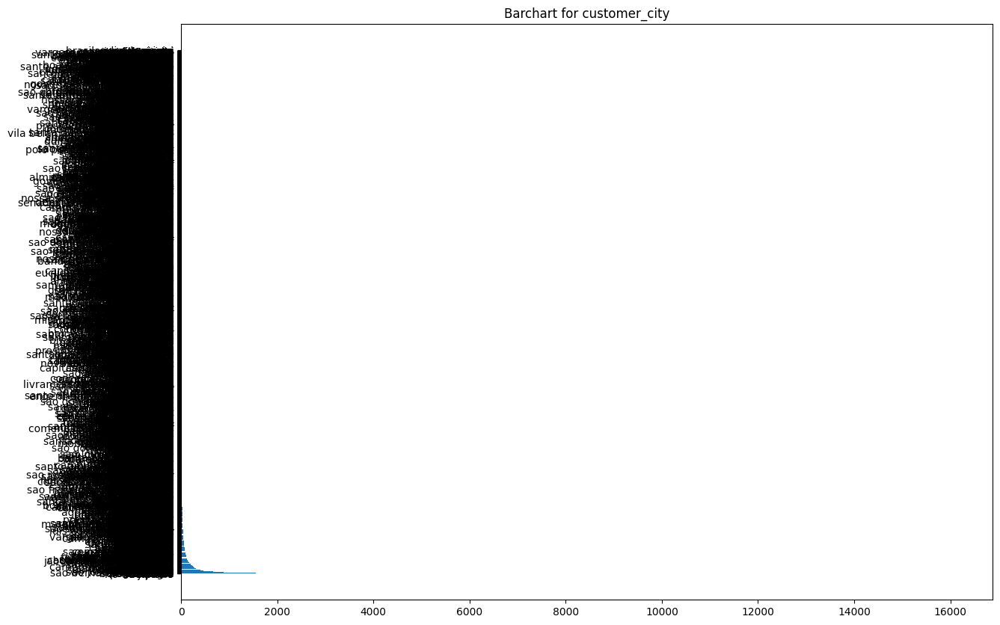

In [103]:
#bar chart untuk customer city
plt.figure(figsize=(14,10))

for col in df_merge_all.columns:
  # Check if the data type of the column is object (string or categorical)
  if col in ['customer_city']:
      value_counts = df_merge_all[col].value_counts()
      plt.barh(y=value_counts.index, width=value_counts)
      plt.title(f'Barchart for {col}')
      plt.show()

  else:
    pass

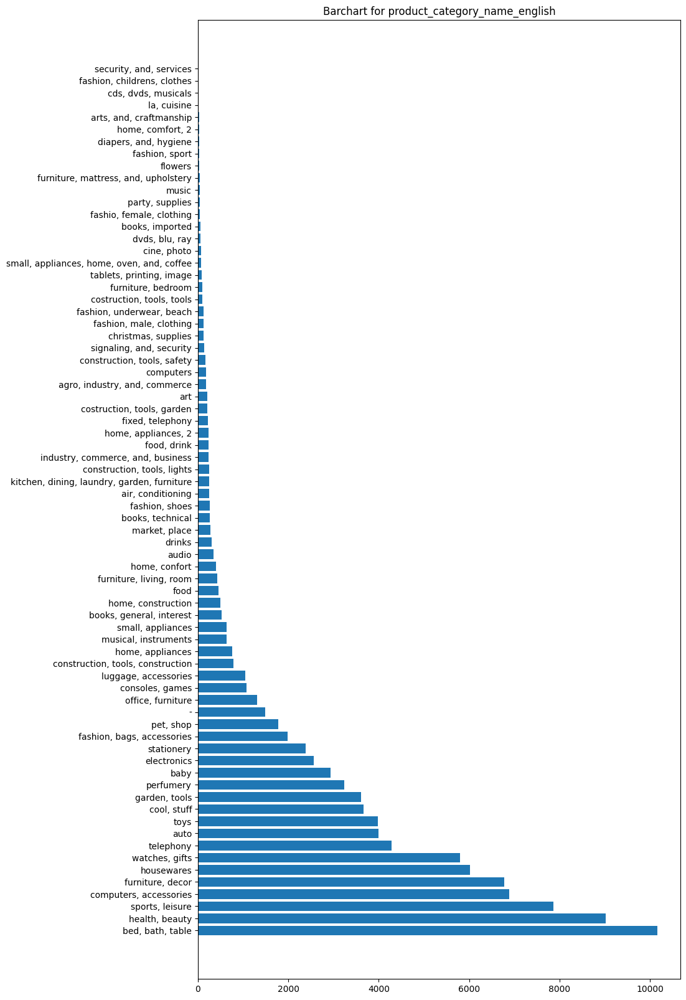

In [1076]:
#barchart product name per categoru
plt.figure(figsize=(10,20))

for col in df_merge_all.columns:
  # Check if the data type of the column is object (string or categorical)
  if col in ['product_category_name_english']:
      value_counts = df_merge_all[col].value_counts()
      plt.barh(y=value_counts.index, width=value_counts)
      plt.title(f'Barchart for {col}')
      plt.show()

  else:
    pass

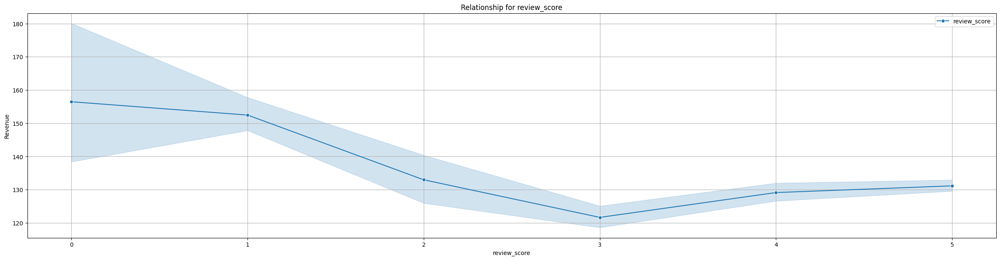

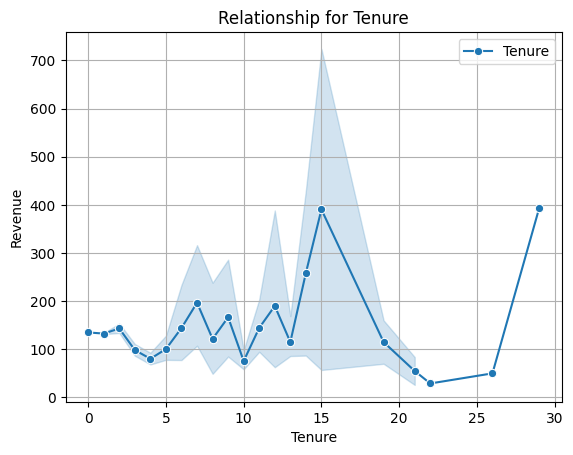

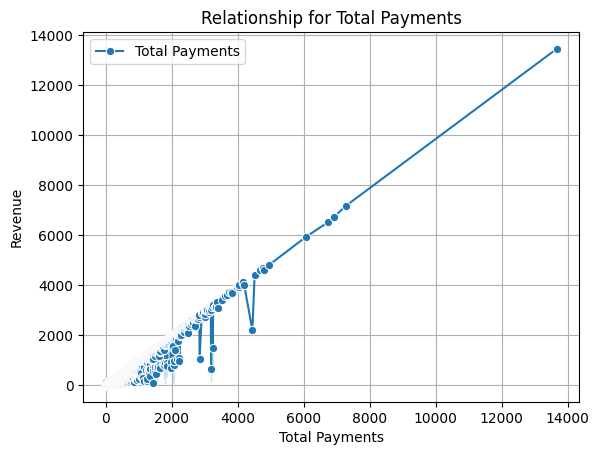

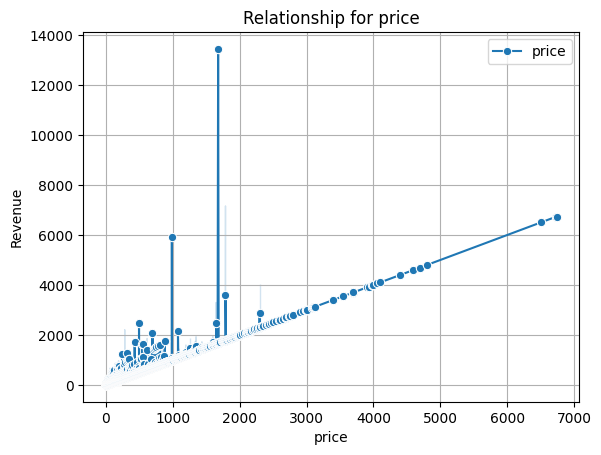

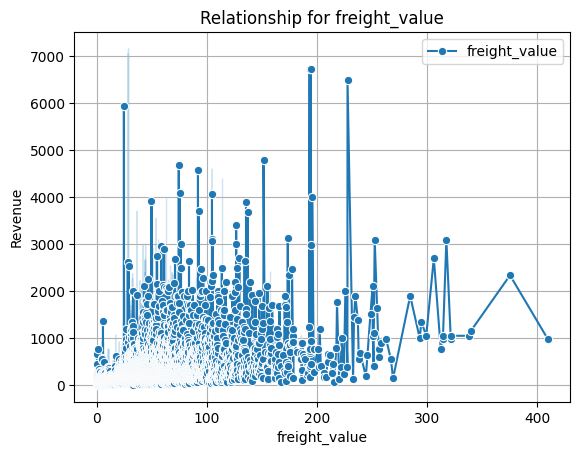

...

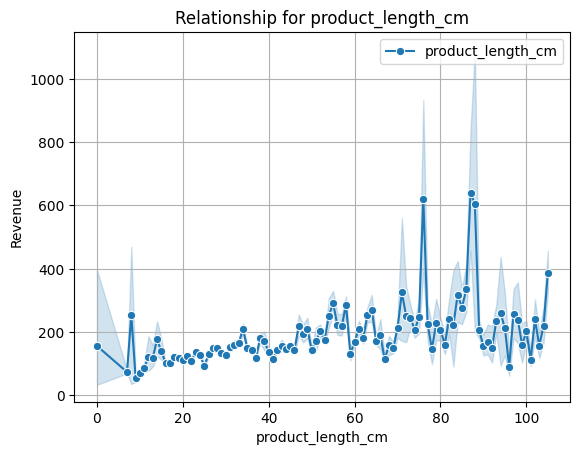

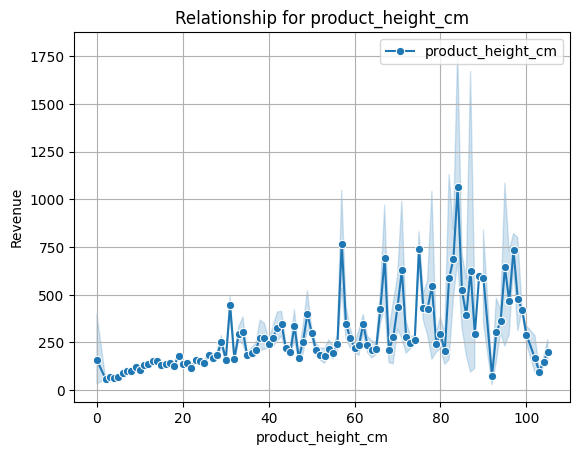

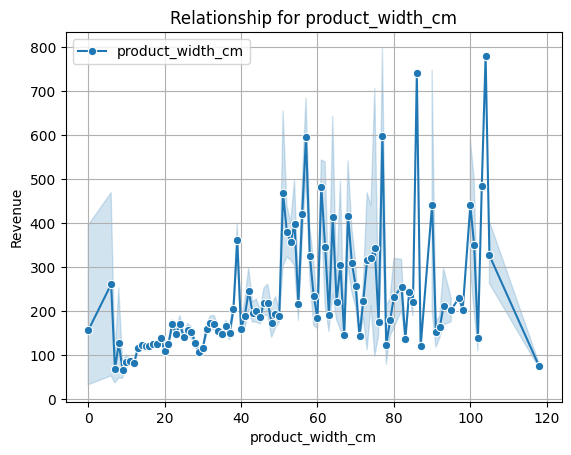

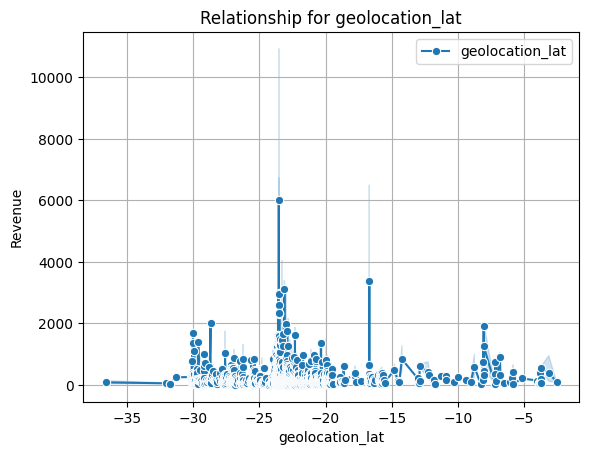

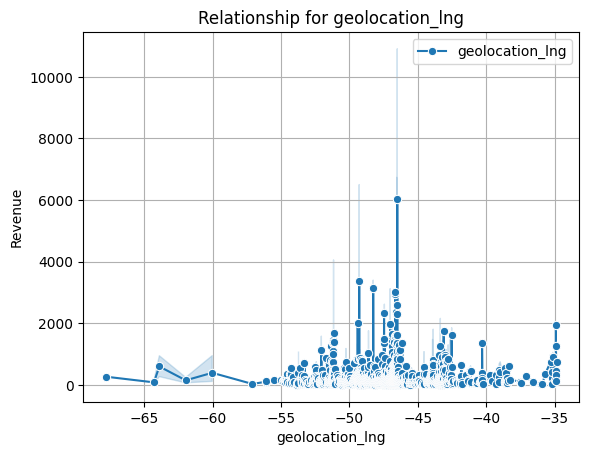

In [1149]:
#scatterplot dan lineplot untuk melihat hubungan antar variabel
plt.figure(figsize=(30,7))

for col in df_merge_all.columns:
    if df_merge_all[col].dtype == 'float64':  # Check if the data type is float
        sns.lineplot(x=df_merge_all[col], y=df_merge_all['Total Price'], marker='o', label=col)
        plt.title(f'Relationship for {col}')
        plt.xlabel(f'{col}')  # Replace with an appropriate label for the X-axis
        plt.ylabel('Revenue')
        plt.grid(True)  # Add grid lines
        plt.legend()  # Add legend based on the column names
        plt.show()

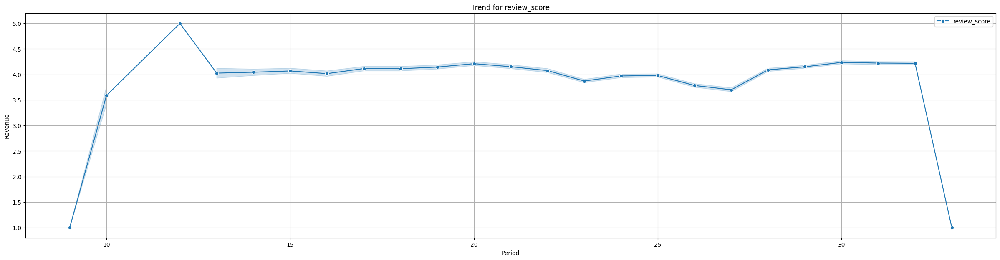

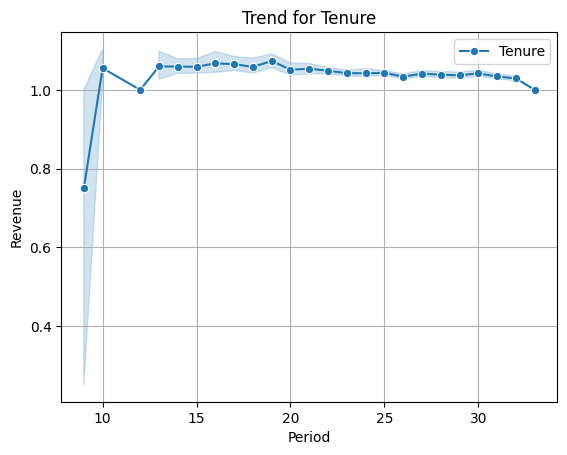

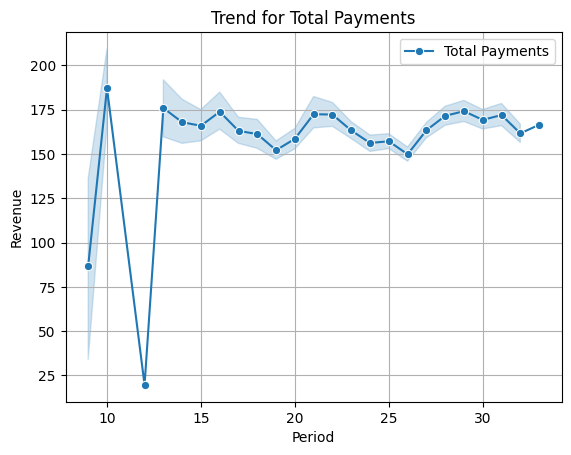

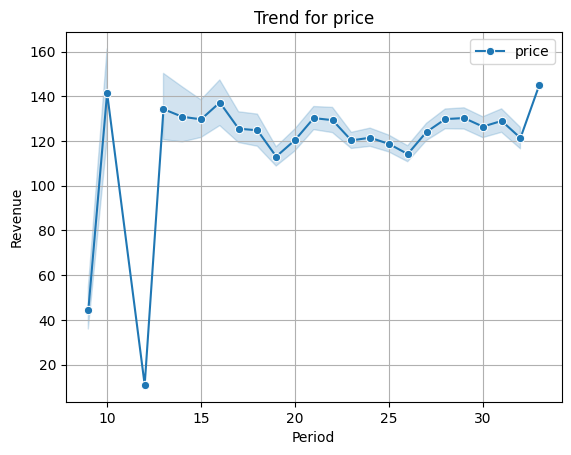

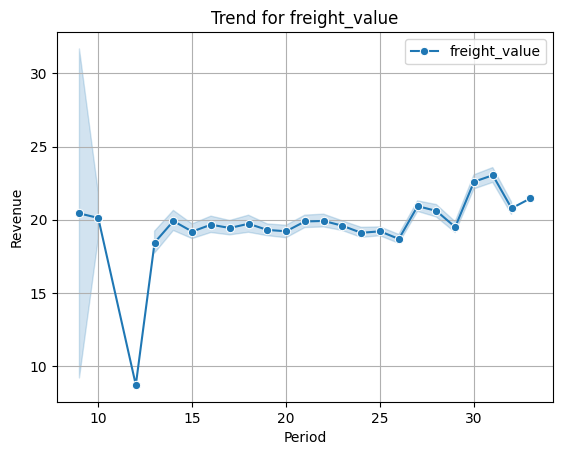

...

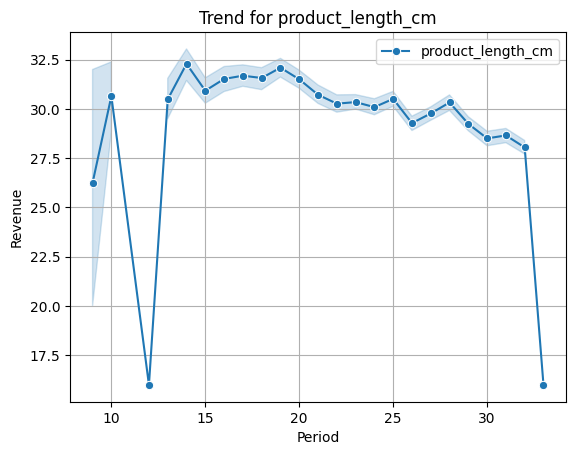

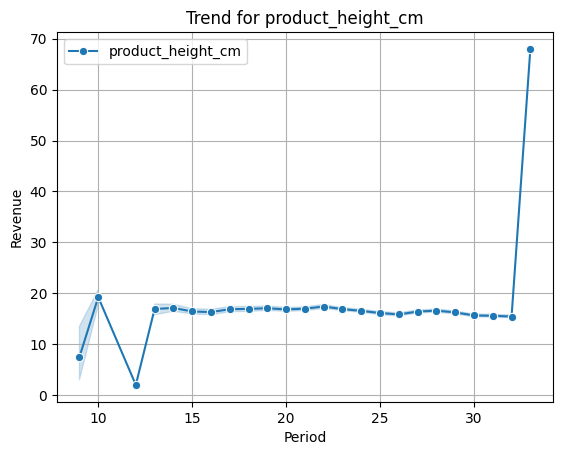

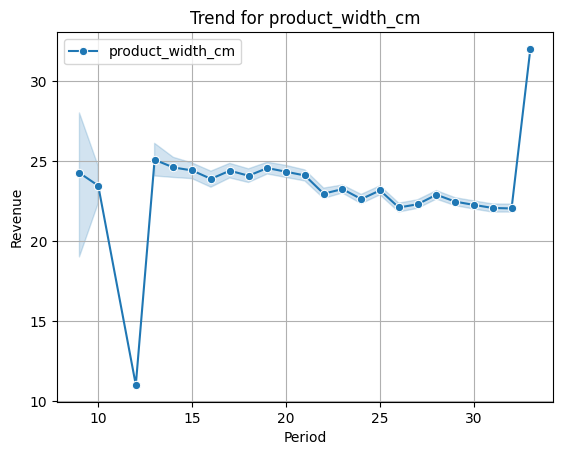

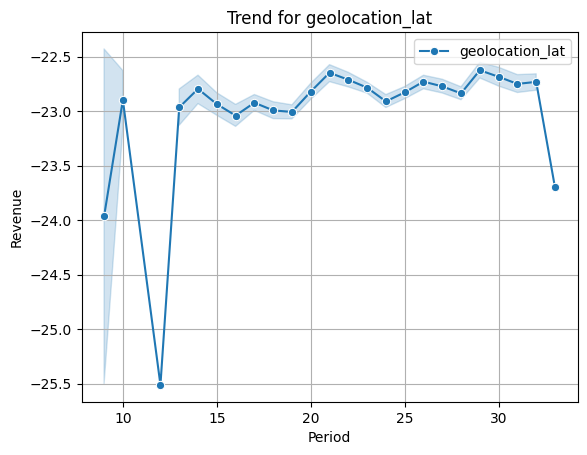

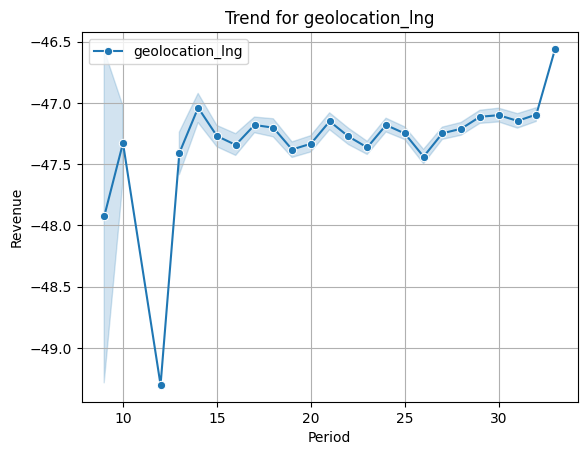

In [104]:
#cek berdasarkan bulan
plt.figure(figsize=(30,7))

for col in df_merge_all.columns:
    if df_merge_all[col].dtype == 'float64':  # Check if the data type is float
        sns.lineplot(x=df_merge_all['purchase_month_order'], y=df_merge_all[col], marker='o', label=col)
        plt.title(f'Trend for {col}')
        plt.xlabel('Period')  # Replace with an appropriate label for the X-axis
        plt.ylabel('Revenue')
        plt.grid(True)  # Add grid lines
        plt.legend()  # Add legend based on the column names
        plt.show()

## **RFM Analysis**

### **RFM Analysis by Customers**

In [1235]:
#buat grouping rfm berdasarkan customer
today = pd.to_datetime(pd.Timestamp('2018-12-31 00:00:00'))

df_rfm = df_merge_all.groupby(by='customer_id').agg({
    'order_purchase_timestamp': lambda x: (today - x.max()).days,
    'customer_id':'count',
    'Total Price': 'sum'
}).rename(columns={
    'order_purchase_timestamp': 'recency',
    'customer_id': 'frequency',
    'Total Price': 'monetary'}).reset_index()

In [1236]:
#buat grouping rfm berdasarkan customer
today = pd.to_datetime(pd.Timestamp('2018-12-31 00:00:00'))

df_rfm_payment = df_merge_all.drop_duplicates(subset='order_id').groupby(by=['customer_id']).agg({
    'Tenure': 'mean',
    'Total Payments':'sum',
    'Total Freight':'sum'
}).rename(columns={
    'Tenure': 'average_tenure',
    'Total Payments': 'paid_purchase_installment',
    'Total Freight': 'delivery_cost'}).reset_index()

df_rfm = pd.merge(df_rfm, df_rfm_payment, on='customer_id', how='left')
df_rfm['installment_revenue'] =df_rfm['paid_purchase_installment'] - (df_rfm['monetary']+df_rfm['delivery_cost'])
df_rfm['rfm_score_without_installment'] = df_rfm['recency'] + df_rfm['frequency'] + df_rfm['monetary']
df_rfm['rfm_score_with_installment'] = df_rfm['recency'] + df_rfm['frequency'] + df_rfm['monetary'] + df_rfm['installment_revenue']

In [1239]:
#sort berdasarkan recency
df_rfm.sort_values(by='recency', ascending=True).head(20)

,customer_id,recency,frequency,monetary,average_tenure,paid_purchase_installment,delivery_cost,installment_revenue,rfm_score_without_installment,rfm_score_with_installment
29063,4b7decb9b58e2569548b8b4c8e20e8d7,118,1,145.00,1.0,166.46,21.46,0.000000e+00,264.00,264.00
76152,c4c66f47534e09a03fc7a878a9eda5ea,123,1,65.00,1.0,74.21,9.21,-1.421085e-14,189.00,189.00
52937,898b7fee99c4e42170ab69ba59be0a8b,123,1,84.99,1.0,93.75,8.76,0.000000e+00,208.99,208.99
88844,e60df9449653a95af4549bbfcb18a6eb,123,1,418.00,1.0,510.96,92.96,0.000000e+00,542.00,542.00
42327,6e353700bc7bcdf6ebc15d6de16d7002,123,1,45.90,1.0,61.29,15.39,0.000000e+00,169.90,169.90
33320,56b1ac2855cc6d7950b4ffa6a9b41b0d,123,1,109.90,1.0,119.42,9.52,0.000000e+00,233.90,233.90
26367,448945bc713d98b6726e82eda6249b9e,123,1,457.75,1.0,497.25,39.50,0.000000e+00,581.75,581.75
32387,54365416b7ef5599f54a6c7821d5d290,123,1,99.00,1.0,106.95,7.95,0.000000e+00,223.00,223.00
6357,10a79ef2783cae3d8d678e85fde235ac,123,1,6.90,1.0,14.29,7.39,0.000000e+00,130.90,130.90
71469,b8c19e70d00f6927388e4f31c923d785,123,1,169.80,1.0,178.25,8.45,0.000000e+00,293.80,293.80


In [1240]:
#sort berdasarkan frequency
df_rfm.sort_values(by='frequency', ascending=False).head(20)

,customer_id,recency,frequency,monetary,average_tenure,paid_purchase_installment,delivery_cost,installment_revenue,rfm_score_without_installment,rfm_score_with_installment
5162,0d861a5e4dd6a9079d89e1330848f0ab,140,8,1138.30,1.0,1157.28,7.34,11.64,1286.30,1297.94
64205,a67a246af6ba598a14cc86df3c0354ee,232,7,563.00,1.0,582.94,0.48,19.46,802.00,821.46
6906,1205480caca6c37f55954da838933b8a,136,7,186.59,1.0,209.57,3.28,19.70,329.59,349.29
18776,30bb84b541c96af98ba7d90b9ebf35d0,404,7,1093.00,1.0,1242.57,33.24,116.33,1504.00,1620.33
31024,50920f8cd0681fd86ebe93670c8fe52e,337,6,306.77,3.0,421.69,51.08,63.84,649.77,713.61
78100,c9dc6fff8500f3735822d5356bcb0e1b,161,6,572.64,1.0,631.91,2.46,56.81,739.64,796.45
73569,be1c4e52bb71e0c54b11a26b8e8d59f2,439,6,715.08,1.0,853.95,35.94,102.93,1160.08,1263.01
78035,c9b6ccc9f42e3ac60bb09a0f53a09973,280,6,359.40,1.0,469.20,18.30,91.50,645.40,736.90
89834,e898b5ef24833b9cb9e2d4f00b937595,128,6,163.19,1.0,217.18,9.00,44.99,297.19,342.18
36193,5e312b0d9bf5c91599eb42120e633b19,558,6,419.40,1.0,1421.69,167.05,835.24,983.40,1818.64


In [1241]:
#sort berdasarkan monetary
df_rfm.sort_values(by='monetary', ascending=False).head(20)

,customer_id,recency,frequency,monetary,average_tenure,paid_purchase_installment,delivery_cost,installment_revenue,rfm_score_without_installment,rfm_score_with_installment
8475,1617b1357756262bfa56ab541c47bc16,457,1,13440.00,1.0,13664.08,224.08,0.000000e+00,13898.00,13898.00
91284,ec5b2ba62e574342386871631fafd3fc,168,1,7160.00,1.0,7274.88,114.88,0.000000e+00,7329.00,7329.00
76948,c6e2731c5b391845f6800c97401a43a9,686,1,6735.00,1.0,6929.31,194.31,0.000000e+00,7422.00,7422.00
94398,f48d464a0baaea338cb25f816991ab1f,158,1,6729.00,1.0,6922.21,193.21,0.000000e+00,6888.00,6888.00
24603,3fd6777bbce08a352fddd04e4a7cc8f6,585,1,6499.00,1.0,6726.66,227.66,0.000000e+00,7085.00,7085.00
2049,05455dfa7cd02f13d132aa7a6a9729c6,401,1,5934.60,1.0,6081.54,146.94,0.000000e+00,6336.60,6336.60
86248,df55c14d1476a9a3467f131269c2477f,638,1,4799.00,1.0,4950.34,151.34,0.000000e+00,5438.00,5438.00
14182,24bbf5fd2f2e1b359ee7de94defc4a15,621,1,4690.00,1.0,4764.34,74.34,0.000000e+00,5312.00,5312.00
86733,e0a2412720e9ea4f26c1ac985f6a7358,171,1,4599.90,1.0,4809.44,209.54,0.000000e+00,4771.90,4771.90
23771,3d979689f636322c62418b6346b1c6d2,191,1,4590.00,1.0,4681.78,91.78,0.000000e+00,4782.00,4782.00


In [1242]:
df_rfm.sort_values(by='rfm_score_without_installment', ascending=False).head(20)

,customer_id,recency,frequency,monetary,average_tenure,paid_purchase_installment,delivery_cost,installment_revenue,rfm_score_without_installment,rfm_score_with_installment
8475,1617b1357756262bfa56ab541c47bc16,457,1,13440.00,1.0,13664.08,224.08,0.000000e+00,13898.00,13898.00
76948,c6e2731c5b391845f6800c97401a43a9,686,1,6735.00,1.0,6929.31,194.31,0.000000e+00,7422.00,7422.00
91284,ec5b2ba62e574342386871631fafd3fc,168,1,7160.00,1.0,7274.88,114.88,0.000000e+00,7329.00,7329.00
24603,3fd6777bbce08a352fddd04e4a7cc8f6,585,1,6499.00,1.0,6726.66,227.66,0.000000e+00,7085.00,7085.00
94398,f48d464a0baaea338cb25f816991ab1f,158,1,6729.00,1.0,6922.21,193.21,0.000000e+00,6888.00,6888.00
2049,05455dfa7cd02f13d132aa7a6a9729c6,401,1,5934.60,1.0,6081.54,146.94,0.000000e+00,6336.60,6336.60
86248,df55c14d1476a9a3467f131269c2477f,638,1,4799.00,1.0,4950.34,151.34,0.000000e+00,5438.00,5438.00
14182,24bbf5fd2f2e1b359ee7de94defc4a15,621,1,4690.00,1.0,4764.34,74.34,0.000000e+00,5312.00,5312.00
23771,3d979689f636322c62418b6346b1c6d2,191,1,4590.00,1.0,4681.78,91.78,0.000000e+00,4782.00,4782.00
86733,e0a2412720e9ea4f26c1ac985f6a7358,171,1,4599.90,1.0,4809.44,209.54,0.000000e+00,4771.90,4771.90


In [1243]:
#sort berdasarkan rfm_score_with_installment
df_rfm.sort_values(by='rfm_score_with_installment', ascending=False).head(20)

,customer_id,recency,frequency,monetary,average_tenure,paid_purchase_installment,delivery_cost,installment_revenue,rfm_score_without_installment,rfm_score_with_installment
8475,1617b1357756262bfa56ab541c47bc16,457,1,13440.00,1.0,13664.08,224.08,0.000000e+00,13898.00,13898.00
76948,c6e2731c5b391845f6800c97401a43a9,686,1,6735.00,1.0,6929.31,194.31,0.000000e+00,7422.00,7422.00
91284,ec5b2ba62e574342386871631fafd3fc,168,1,7160.00,1.0,7274.88,114.88,0.000000e+00,7329.00,7329.00
24603,3fd6777bbce08a352fddd04e4a7cc8f6,585,1,6499.00,1.0,6726.66,227.66,0.000000e+00,7085.00,7085.00
94398,f48d464a0baaea338cb25f816991ab1f,158,1,6729.00,1.0,6922.21,193.21,0.000000e+00,6888.00,6888.00
2049,05455dfa7cd02f13d132aa7a6a9729c6,401,1,5934.60,1.0,6081.54,146.94,0.000000e+00,6336.60,6336.60
86248,df55c14d1476a9a3467f131269c2477f,638,1,4799.00,1.0,4950.34,151.34,0.000000e+00,5438.00,5438.00
14182,24bbf5fd2f2e1b359ee7de94defc4a15,621,1,4690.00,1.0,4764.34,74.34,0.000000e+00,5312.00,5312.00
23771,3d979689f636322c62418b6346b1c6d2,191,1,4590.00,1.0,4681.78,91.78,0.000000e+00,4782.00,4782.00
86733,e0a2412720e9ea4f26c1ac985f6a7358,171,1,4599.90,1.0,4809.44,209.54,0.000000e+00,4771.90,4771.90


### **RFM Analysis by Products Category**

In [1244]:
#buat grouping rfm
today = pd.to_datetime(pd.Timestamp('2018-12-31 00:00:00'))

df_rfm = df_merge_all.groupby(by='product_category_name_english').agg({
    'order_purchase_timestamp': lambda x: (today - x.max()).days,
    'product_category_name_english':'count',
    'Total Price': 'sum'
}).rename(columns={
    'order_purchase_timestamp': 'recency',
    'product_category_name_english': 'frequency',
    'Total Price': 'monetary'}).reset_index()

In [1245]:
today = pd.to_datetime(pd.Timestamp('2018-12-31 00:00:00'))

df_rfm_payment = df_merge_all.drop_duplicates(subset='order_id').groupby(by=['product_category_name_english']).agg({
    'Tenure': 'mean',
    'Total Payments':'sum',
    'Total Freight':'sum'
}).rename(columns={
    'Tenure': 'average_tenure',
    'Total Payments': 'paid_purchase_installment',
    'Total Freight': 'delivery_cost'}).reset_index()

df_rfm = pd.merge(df_rfm, df_rfm_payment, on='product_category_name_english', how='left')
df_rfm['installment_revenue'] =df_rfm['paid_purchase_installment'] - (df_rfm['monetary']+df_rfm['delivery_cost'])
df_rfm['rfm_score_without_installment'] = df_rfm['recency'] + df_rfm['frequency'] + df_rfm['monetary']
df_rfm['rfm_score_with_installment'] = df_rfm['recency'] + df_rfm['frequency'] + df_rfm['monetary'] + df_rfm['installment_revenue']

In [1246]:
#sort berdasarkan recency
df_rfm.sort_values(by='recency', ascending=True).head(20)

,product_category_name_english,recency,frequency,monetary,average_tenure,paid_purchase_installment,delivery_cost,installment_revenue,rfm_score_without_installment,rfm_score_with_installment
52,"kitchen, dining, laundry, garden, furniture",118,248,46328.37,1.044715,58752.65,11986.73,437.55,46694.37,47131.92
37,food,123,453,29393.41,1.036036,36372.50,7124.96,-145.87,29969.41,29823.54
16,"computers, accessories",123,6887,911954.32,1.032563,1061387.07,143269.15,6163.60,918964.32,925127.92
44,"health, beauty",123,9022,1258681.34,1.031357,1440819.49,178723.08,3415.07,1267826.34,1271241.41
70,toys,123,3979,483946.60,1.037726,562621.58,75771.76,2903.22,488048.60,490951.82
59,"party, supplies",123,39,4485.18,1.078947,5219.96,814.68,-79.90,4647.18,4567.28
71,"watches, gifts",123,5799,1205005.68,1.036601,1304642.90,97784.28,1852.94,1210927.68,1212780.62
66,"sports, leisure",123,7858,988048.97,1.036054,1158283.61,165443.50,4791.14,996029.97,1000821.11
7,baby,124,2933,411764.89,1.043754,479357.64,66265.20,1327.55,414821.89,416149.44
22,"costruction, tools, garden",124,212,25715.89,1.031746,29956.16,4826.10,-585.83,26051.89,25466.06


In [1247]:
#sort berdasarkan frequency
df_rfm.sort_values(by='frequency', ascending=False)

,product_category_name_english,recency,frequency,monetary,average_tenure,paid_purchase_installment,delivery_cost,installment_revenue,rfm_score_without_installment,rfm_score_with_installment
8,"bed, bath, table",124,10160,1036988.68,1.063332,1242928.76,190450.45,15489.63,1047272.68,1062762.31
44,"health, beauty",123,9022,1258681.34,1.031357,1440819.49,178723.08,3415.07,1267826.34,1271241.41
66,"sports, leisure",123,7858,988048.97,1.036054,1158283.61,165443.50,4791.14,996029.97,1000821.11
16,"computers, accessories",123,6887,911954.32,1.032563,1061387.07,143269.15,6163.60,918964.32,925127.92
40,"furniture, decor",124,6781,729762.49,1.052308,903628.58,163476.99,10389.10,736667.49,747056.59
50,housewares,124,6019,632248.66,1.056309,777999.55,142182.66,3568.23,638391.66,641959.89
71,"watches, gifts",123,5799,1205005.68,1.036601,1304642.90,97784.28,1852.94,1210927.68,1212780.62
69,telephony,124,4287,323667.53,1.039169,394827.72,69718.00,1442.19,328078.53,329520.72
6,auto,124,3991,592720.11,1.033763,685351.51,90291.48,2339.92,596835.11,599175.03
70,toys,123,3979,483946.60,1.037726,562621.58,75771.76,2903.22,488048.60,490951.82


In [1248]:
#sort berdasarkan monetary
df_rfm.sort_values(by='monetary', ascending=False).head(20)

,product_category_name_english,recency,frequency,monetary,average_tenure,paid_purchase_installment,delivery_cost,installment_revenue,rfm_score_without_installment,rfm_score_with_installment
44,"health, beauty",123,9022,1258681.34,1.031357,1440819.49,178723.08,3415.07,1267826.34,1271241.41
71,"watches, gifts",123,5799,1205005.68,1.036601,1304642.90,97784.28,1852.94,1210927.68,1212780.62
8,"bed, bath, table",124,10160,1036988.68,1.063332,1242928.76,190450.45,15489.63,1047272.68,1062762.31
66,"sports, leisure",123,7858,988048.97,1.036054,1158283.61,165443.50,4791.14,996029.97,1000821.11
16,"computers, accessories",123,6887,911954.32,1.032563,1061387.07,143269.15,6163.60,918964.32,925127.92
40,"furniture, decor",124,6781,729762.49,1.052308,903628.58,163476.99,10389.10,736667.49,747056.59
21,"cool, stuff",124,3658,635290.85,1.049736,719092.09,83044.04,757.20,639072.85,639830.05
50,housewares,124,6019,632248.66,1.056309,777999.55,142182.66,3568.23,638391.66,641959.89
6,auto,124,3991,592720.11,1.033763,685351.51,90291.48,2339.92,596835.11,599175.03
43,"garden, tools",125,3607,485256.46,1.057488,585434.20,95839.88,4337.86,488988.46,493326.32


In [1249]:
#sort berdasarkan rfm_score_without_installment
df_rfm.sort_values(by='rfm_score_without_installment', ascending=False).head(20)

,product_category_name_english,recency,frequency,monetary,average_tenure,paid_purchase_installment,delivery_cost,installment_revenue,rfm_score_without_installment,rfm_score_with_installment
44,"health, beauty",123,9022,1258681.34,1.031357,1440819.49,178723.08,3415.07,1267826.34,1271241.41
71,"watches, gifts",123,5799,1205005.68,1.036601,1304642.90,97784.28,1852.94,1210927.68,1212780.62
8,"bed, bath, table",124,10160,1036988.68,1.063332,1242928.76,190450.45,15489.63,1047272.68,1062762.31
66,"sports, leisure",123,7858,988048.97,1.036054,1158283.61,165443.50,4791.14,996029.97,1000821.11
16,"computers, accessories",123,6887,911954.32,1.032563,1061387.07,143269.15,6163.60,918964.32,925127.92
40,"furniture, decor",124,6781,729762.49,1.052308,903628.58,163476.99,10389.10,736667.49,747056.59
21,"cool, stuff",124,3658,635290.85,1.049736,719092.09,83044.04,757.20,639072.85,639830.05
50,housewares,124,6019,632248.66,1.056309,777999.55,142182.66,3568.23,638391.66,641959.89
6,auto,124,3991,592720.11,1.033763,685351.51,90291.48,2339.92,596835.11,599175.03
43,"garden, tools",125,3607,485256.46,1.057488,585434.20,95839.88,4337.86,488988.46,493326.32


In [1279]:
#sort berdasarkan rfm_score_with_installment
df_rfm.sort_values(by='rfm_score_with_installment', ascending=False).head(20)

,product_category_name_english,recency,frequency,monetary,average_tenure,paid_purchase_installment,delivery_cost,installment_revenue,rfm_score_without_installment,rfm_score_with_installment
44,"health, beauty",123,9022,1258681.34,1.031357,1440819.49,178723.08,3415.07,1267826.34,1271241.41
71,"watches, gifts",123,5799,1205005.68,1.036601,1304642.90,97784.28,1852.94,1210927.68,1212780.62
8,"bed, bath, table",124,10160,1036988.68,1.063332,1242928.76,190450.45,15489.63,1047272.68,1062762.31
66,"sports, leisure",123,7858,988048.97,1.036054,1158283.61,165443.50,4791.14,996029.97,1000821.11
16,"computers, accessories",123,6887,911954.32,1.032563,1061387.07,143269.15,6163.60,918964.32,925127.92
40,"furniture, decor",124,6781,729762.49,1.052308,903628.58,163476.99,10389.10,736667.49,747056.59
50,housewares,124,6019,632248.66,1.056309,777999.55,142182.66,3568.23,638391.66,641959.89
21,"cool, stuff",124,3658,635290.85,1.049736,719092.09,83044.04,757.20,639072.85,639830.05
6,auto,124,3991,592720.11,1.033763,685351.51,90291.48,2339.92,596835.11,599175.03
43,"garden, tools",125,3607,485256.46,1.057488,585434.20,95839.88,4337.86,488988.46,493326.32


### **RFM Analysis by Products Category and Customer Domains**

In [1251]:
#buat grouping rfm
today = pd.to_datetime(pd.Timestamp('2018-12-31 00:00:00'))

df_rfm_by_city_and_product = df_merge_all.groupby(by=['product_category_name_english','customer_city']).agg({
    'order_purchase_timestamp': lambda x: (today - x.max()).days,
    'product_category_name_english':'count',
    'Total Price': 'sum'
}).rename(columns={
    'order_purchase_timestamp': 'recency',
    'product_category_name_english': 'frequency',
    'Total Price': 'monetary'}).reset_index()

In [1252]:
today = pd.to_datetime(pd.Timestamp('2018-12-31 00:00:00'))

df_rfm_by_city_and_product_payment = df_merge_all.drop_duplicates(subset='order_id').groupby(by=['product_category_name_english','customer_city']).agg({
    'Tenure': 'mean',
    'Total Payments':'sum',
    'Total Freight':'sum'
}).rename(columns={
    'Tenure': 'average_tenure',
    'Total Payments': 'paid_purchase_installment',
    'Total Freight': 'delivery_cost'}).reset_index()

df_rfm_by_city_and_product = pd.merge(df_rfm_by_city_and_product, df_rfm_by_city_and_product_payment, on=['product_category_name_english','customer_city'], how='left')
df_rfm_by_city_and_product['installment_revenue'] =df_rfm_by_city_and_product['paid_purchase_installment'] - (df_rfm_by_city_and_product['monetary']+df_rfm_by_city_and_product['delivery_cost'])
df_rfm_by_city_and_product['rfm_score_without_installment'] = df_rfm_by_city_and_product['recency'] + df_rfm_by_city_and_product['frequency'] + df_rfm_by_city_and_product['monetary']
df_rfm_by_city_and_product['rfm_score_with_installment'] = df_rfm_by_city_and_product['recency'] + df_rfm_by_city_and_product['frequency'] + df_rfm_by_city_and_product['monetary'] + df_rfm_by_city_and_product['installment_revenue']

In [1253]:
#sort berdasarkan recency
df_rfm_by_city_and_product.sort_values(by='recency', ascending=True).head(20)

,product_category_name_english,customer_city,recency,frequency,monetary,average_tenure,paid_purchase_installment,delivery_cost,installment_revenue,rfm_score_without_installment,rfm_score_with_installment
17063,"kitchen, dining, laundry, garden, furniture",sao paulo,118,49,8484.84,1.000000,10700.31,2107.39,1.080800e+02,8651.84,8759.92
14623,"health, beauty",sao jose dos campos,123,67,6701.44,1.030303,7677.32,967.92,7.960000e+00,6891.44,6899.40
16997,"kitchen, dining, laundry, garden, furniture",curitiba,123,7,1994.29,1.000000,2261.50,267.21,0.000000e+00,2124.29,2124.29
18512,"party, supplies",sao caetano do sul,123,1,24.90,1.000000,33.23,8.33,0.000000e+00,148.90,148.90
14641,"health, beauty",sao paulo,123,1579,189361.87,1.030184,212136.54,22115.93,6.587400e+02,191063.87,191722.61
5676,"computers, accessories",limeira,123,9,909.40,1.000000,1034.59,101.56,2.363000e+01,1041.40,1065.03
25510,"watches, gifts",sao bernardo do campo,123,56,9923.37,1.071429,10579.64,656.27,-1.818989e-12,10102.37,10102.37
21494,"sports, leisure",sao paulo,123,1291,144533.26,1.045238,164583.71,19501.07,5.493800e+02,145947.26,146496.64
24984,"watches, gifts",hortolandia,123,15,1900.49,1.000000,2052.69,122.20,3.000000e+01,2038.49,2068.49
24412,toys,sao paulo,123,634,69635.89,1.033003,78427.94,9149.47,-3.574200e+02,70392.89,70035.47


In [1254]:
#sort berdasarkan frequency
df_rfm_by_city_and_product.sort_values(by='frequency', ascending=False).head(20)

,product_category_name_english,customer_city,recency,frequency,monetary,average_tenure,paid_purchase_installment,delivery_cost,installment_revenue,rfm_score_without_installment,rfm_score_with_installment
4143,"bed, bath, table",sao paulo,124,1798,170705.41,1.075795,200222.53,26613.68,2903.44,172627.41,175530.85
14641,"health, beauty",sao paulo,123,1579,189361.87,1.030184,212136.54,22115.93,658.74,191063.87,191722.61
21494,"sports, leisure",sao paulo,123,1291,144533.26,1.045238,164583.71,19501.07,549.38,145947.26,146496.64
16674,housewares,sao paulo,124,1137,104820.45,1.055759,124798.68,19851.29,126.94,106081.45,106208.39
11973,"furniture, decor",sao paulo,129,1053,100033.05,1.076766,120423.31,18453.59,1936.67,101215.05,103151.72
6142,"computers, accessories",sao paulo,124,1045,144635.68,1.023928,161564.12,16010.40,918.04,145804.68,146722.72
25555,"watches, gifts",sao paulo,124,819,165897.46,1.027062,175761.63,9329.23,534.94,166840.46,167375.40
3991,"bed, bath, table",rio de janeiro,125,783,77871.29,1.072323,94744.10,15318.06,1554.75,78779.29,80334.04
24412,toys,sao paulo,123,634,69635.89,1.033003,78427.94,9149.47,-357.42,70392.89,70035.47
23456,telephony,sao paulo,124,580,38303.64,1.047535,43570.19,5793.55,-527.00,39007.64,38480.64


In [1255]:
#sort berdasarkan monetary
df_rfm_by_city_and_product.sort_values(by='monetary', ascending=False).head(20)

,product_category_name_english,customer_city,recency,frequency,monetary,average_tenure,paid_purchase_installment,delivery_cost,installment_revenue,rfm_score_without_installment,rfm_score_with_installment
14641,"health, beauty",sao paulo,123,1579,189361.87,1.030184,212136.54,22115.93,658.74,191063.87,191722.61
4143,"bed, bath, table",sao paulo,124,1798,170705.41,1.075795,200222.53,26613.68,2903.44,172627.41,175530.85
25555,"watches, gifts",sao paulo,124,819,165897.46,1.027062,175761.63,9329.23,534.94,166840.46,167375.40
6142,"computers, accessories",sao paulo,124,1045,144635.68,1.023928,161564.12,16010.40,918.04,145804.68,146722.72
21494,"sports, leisure",sao paulo,123,1291,144533.26,1.045238,164583.71,19501.07,549.38,145947.26,146496.64
16674,housewares,sao paulo,124,1137,104820.45,1.055759,124798.68,19851.29,126.94,106081.45,106208.39
11973,"furniture, decor",sao paulo,129,1053,100033.05,1.076766,120423.31,18453.59,1936.67,101215.05,103151.72
25429,"watches, gifts",rio de janeiro,128,452,93028.74,1.013825,100202.38,7006.72,166.92,93608.74,93775.66
14473,"health, beauty",rio de janeiro,124,529,86558.34,1.038388,96854.21,10087.42,208.45,87211.34,87419.79
3991,"bed, bath, table",rio de janeiro,125,783,77871.29,1.072323,94744.10,15318.06,1554.75,78779.29,80334.04


In [1256]:
#sort berdasarkan rfm_score_without_installment
df_rfm_by_city_and_product.sort_values(by='rfm_score_without_installment', ascending=False).head(20)

,product_category_name_english,customer_city,recency,frequency,monetary,average_tenure,paid_purchase_installment,delivery_cost,installment_revenue,rfm_score_without_installment,rfm_score_with_installment
14641,"health, beauty",sao paulo,123,1579,189361.87,1.030184,212136.54,22115.93,658.74,191063.87,191722.61
4143,"bed, bath, table",sao paulo,124,1798,170705.41,1.075795,200222.53,26613.68,2903.44,172627.41,175530.85
25555,"watches, gifts",sao paulo,124,819,165897.46,1.027062,175761.63,9329.23,534.94,166840.46,167375.40
21494,"sports, leisure",sao paulo,123,1291,144533.26,1.045238,164583.71,19501.07,549.38,145947.26,146496.64
6142,"computers, accessories",sao paulo,124,1045,144635.68,1.023928,161564.12,16010.40,918.04,145804.68,146722.72
16674,housewares,sao paulo,124,1137,104820.45,1.055759,124798.68,19851.29,126.94,106081.45,106208.39
11973,"furniture, decor",sao paulo,129,1053,100033.05,1.076766,120423.31,18453.59,1936.67,101215.05,103151.72
25429,"watches, gifts",rio de janeiro,128,452,93028.74,1.013825,100202.38,7006.72,166.92,93608.74,93775.66
14473,"health, beauty",rio de janeiro,124,529,86558.34,1.038388,96854.21,10087.42,208.45,87211.34,87419.79
3991,"bed, bath, table",rio de janeiro,125,783,77871.29,1.072323,94744.10,15318.06,1554.75,78779.29,80334.04


In [1257]:
#sort berdasarkan rfm_score_with_installment
df_rfm_by_city_and_product.sort_values(by='rfm_score_with_installment', ascending=False).head(20)

,product_category_name_english,customer_city,recency,frequency,monetary,average_tenure,paid_purchase_installment,delivery_cost,installment_revenue,rfm_score_without_installment,rfm_score_with_installment
14641,"health, beauty",sao paulo,123,1579,189361.87,1.030184,212136.54,22115.93,658.74,191063.87,191722.61
4143,"bed, bath, table",sao paulo,124,1798,170705.41,1.075795,200222.53,26613.68,2903.44,172627.41,175530.85
25555,"watches, gifts",sao paulo,124,819,165897.46,1.027062,175761.63,9329.23,534.94,166840.46,167375.40
6142,"computers, accessories",sao paulo,124,1045,144635.68,1.023928,161564.12,16010.40,918.04,145804.68,146722.72
21494,"sports, leisure",sao paulo,123,1291,144533.26,1.045238,164583.71,19501.07,549.38,145947.26,146496.64
16674,housewares,sao paulo,124,1137,104820.45,1.055759,124798.68,19851.29,126.94,106081.45,106208.39
11973,"furniture, decor",sao paulo,129,1053,100033.05,1.076766,120423.31,18453.59,1936.67,101215.05,103151.72
25429,"watches, gifts",rio de janeiro,128,452,93028.74,1.013825,100202.38,7006.72,166.92,93608.74,93775.66
14473,"health, beauty",rio de janeiro,124,529,86558.34,1.038388,96854.21,10087.42,208.45,87211.34,87419.79
3991,"bed, bath, table",rio de janeiro,125,783,77871.29,1.072323,94744.10,15318.06,1554.75,78779.29,80334.04


### **RFM Analysis by Customer Cities**

In [1258]:
#buat grouping rfm
today = pd.to_datetime(pd.Timestamp('2018-12-31 00:00:00'))

df_rfm_by_city = df_merge_all.groupby(by=['customer_city']).agg({
    'order_purchase_timestamp': lambda x: (today - x.max()).days,
    'product_category_name_english':'count',
    'Total Price': 'sum',
    'customer_id':'nunique',
    'seller_id':'nunique'
}).rename(columns={
    'order_purchase_timestamp': 'recency',
    'product_category_name_english': 'frequency',
    'Total Price': 'monetary',
    'customer_id': 'customer_num',
    'seller_id': 'seller_num'}).reset_index()

In [1259]:
today = pd.to_datetime(pd.Timestamp('2018-12-31 00:00:00'))

df_rfm_by_city_payment = df_merge_all.drop_duplicates(subset='order_id').groupby(by=['customer_city']).agg({
    'Tenure': 'mean',
    'Total Payments':'sum',
    'Total Freight':'sum'
}).rename(columns={
    'Tenure': 'average_tenure',
    'Total Payments': 'paid_purchase_installment',
    'Total Freight': 'delivery_cost'}).reset_index()

df_rfm_by_city = pd.merge(df_rfm_by_city, df_rfm_by_city_payment, on='customer_city', how='left')
df_rfm_by_city['installment_revenue'] = df_rfm_by_city['paid_purchase_installment'] - (df_rfm_by_city['monetary']+df_rfm_by_city['delivery_cost'])
df_rfm_by_city['rfm_score_without_installment'] = df_rfm_by_city['recency'] + df_rfm_by_city['frequency'] + df_rfm_by_city['monetary']
df_rfm_by_city['rfm_score_with_installment'] = df_rfm_by_city['recency'] + df_rfm_by_city['frequency'] + df_rfm_by_city['monetary'] + df_rfm_by_city['installment_revenue']

In [1260]:
#sort berdasarkan recency
df_rfm_by_city.sort_values(by='recency', ascending=True).head(20)

,customer_city,recency,frequency,monetary,customer_num,seller_num,average_tenure,paid_purchase_installment,delivery_cost,installment_revenue,rfm_score_without_installment,rfm_score_with_installment
3588,sao paulo,118,16076,1914924.54,15402,1896,1.043566,2170430.09,245708.12,9797.43,1931118.54,1940915.97
3420,sao bernardo do campo,123,956,104540.99,928,482,1.044181,119025.48,14074.89,409.60,105619.99,106029.59
3230,salto,123,96,10709.39,94,82,1.074468,12186.31,1460.97,15.95,10928.39,10944.34
1141,curitiba,123,1558,211738.06,1510,658,1.036424,244862.41,32223.74,900.61,213419.06,214319.67
3545,sao jose dos campos,123,713,78650.94,686,395,1.055394,89991.31,11000.15,340.22,79486.94,79827.16
2093,limeira,123,201,23083.89,189,140,1.037037,26374.18,3102.76,187.53,23407.89,23595.42
1550,hortolandia,123,154,16523.21,145,108,1.027586,18748.57,2124.13,101.23,16800.21,16901.44
2660,paracatu,123,67,8430.41,63,57,1.015873,10182.22,1558.86,192.95,8620.41,8813.36
3425,sao caetano do sul,123,283,32452.60,275,204,1.018182,36760.98,4198.42,109.96,32858.60,32968.56
1526,guarulhos,124,1217,144268.39,1178,551,1.051783,163590.21,18714.94,606.88,145609.39,146216.27


In [1261]:
#sort berdasarkan frequency
df_rfm_by_city.sort_values(by='frequency', ascending=False).head(20)

,customer_city,recency,frequency,monetary,customer_num,seller_num,average_tenure,paid_purchase_installment,delivery_cost,installment_revenue,rfm_score_without_installment,rfm_score_with_installment
3588,sao paulo,118,16076,1914924.54,15402,1896,1.043566,2170430.09,245708.12,9797.43,1931118.54,1940915.97
3147,rio de janeiro,124,7066,992538.86,6834,1364,1.047264,1154374.13,157617.59,4217.68,999728.86,1003946.54
452,belo horizonte,125,2858,355611.13,2750,907,1.035273,416833.75,59208.18,2014.44,358594.13,360608.57
557,brasilia,126,2202,301920.25,2116,783,1.028828,352327.96,48715.92,1691.79,304248.25,305940.04
1141,curitiba,123,1558,211738.06,1510,658,1.036424,244862.41,32223.74,900.61,213419.06,214319.67
705,campinas,124,1487,187844.53,1429,636,1.049685,212567.77,23892.06,831.18,189455.53,190286.71
2956,porto alegre,124,1432,190562.08,1372,600,1.027697,224120.08,32346.78,1211.22,192118.08,193329.30
3239,salvador,131,1290,181104.42,1238,564,1.082391,216849.99,34453.46,1292.11,182525.42,183817.53
1526,guarulhos,124,1217,144268.39,1178,551,1.051783,163590.21,18714.94,606.88,145609.39,146216.27
3420,sao bernardo do campo,123,956,104540.99,928,482,1.044181,119025.48,14074.89,409.60,105619.99,106029.59


In [1262]:
#sort berdasarkan monetary
df_rfm_by_city.sort_values(by='monetary', ascending=False).head(20)

,customer_city,recency,frequency,monetary,customer_num,seller_num,average_tenure,paid_purchase_installment,delivery_cost,installment_revenue,rfm_score_without_installment,rfm_score_with_installment
3588,sao paulo,118,16076,1914924.54,15402,1896,1.043566,2170430.09,245708.12,9797.43,1931118.54,1940915.97
3147,rio de janeiro,124,7066,992538.86,6834,1364,1.047264,1154374.13,157617.59,4217.68,999728.86,1003946.54
452,belo horizonte,125,2858,355611.13,2750,907,1.035273,416833.75,59208.18,2014.44,358594.13,360608.57
557,brasilia,126,2202,301920.25,2116,783,1.028828,352327.96,48715.92,1691.79,304248.25,305940.04
1141,curitiba,123,1558,211738.06,1510,658,1.036424,244862.41,32223.74,900.61,213419.06,214319.67
2956,porto alegre,124,1432,190562.08,1372,600,1.027697,224120.08,32346.78,1211.22,192118.08,193329.30
705,campinas,124,1487,187844.53,1429,636,1.049685,212567.77,23892.06,831.18,189455.53,190286.71
3239,salvador,131,1290,181104.42,1238,564,1.082391,216849.99,34453.46,1292.11,182525.42,183817.53
1526,guarulhos,124,1217,144268.39,1178,551,1.051783,163590.21,18714.94,606.88,145609.39,146216.27
2455,niteroi,128,881,117907.12,845,467,1.078107,137929.61,19428.30,594.19,118916.12,119510.31


In [1280]:
#sort berdasarkan rfm_score_without_installment
df_rfm_by_city.sort_values(by='rfm_score_without_installment', ascending=False).head(20)

,customer_city,recency,frequency,monetary,customer_num,seller_num,average_tenure,paid_purchase_installment,delivery_cost,installment_revenue,rfm_score_without_installment,rfm_score_with_installment
3588,sao paulo,118,16076,1914924.54,15402,1896,1.043566,2170430.09,245708.12,9797.43,1931118.54,1940915.97
3147,rio de janeiro,124,7066,992538.86,6834,1364,1.047264,1154374.13,157617.59,4217.68,999728.86,1003946.54
452,belo horizonte,125,2858,355611.13,2750,907,1.035273,416833.75,59208.18,2014.44,358594.13,360608.57
557,brasilia,126,2202,301920.25,2116,783,1.028828,352327.96,48715.92,1691.79,304248.25,305940.04
1141,curitiba,123,1558,211738.06,1510,658,1.036424,244862.41,32223.74,900.61,213419.06,214319.67
2956,porto alegre,124,1432,190562.08,1372,600,1.027697,224120.08,32346.78,1211.22,192118.08,193329.30
705,campinas,124,1487,187844.53,1429,636,1.049685,212567.77,23892.06,831.18,189455.53,190286.71
3239,salvador,131,1290,181104.42,1238,564,1.082391,216849.99,34453.46,1292.11,182525.42,183817.53
1526,guarulhos,124,1217,144268.39,1178,551,1.051783,163590.21,18714.94,606.88,145609.39,146216.27
2455,niteroi,128,881,117907.12,845,467,1.078107,137929.61,19428.30,594.19,118916.12,119510.31


In [1281]:
#sort berdasarkan rfm_score_with_installment
df_rfm_by_city.sort_values(by='rfm_score_with_installment', ascending=False).head(20)

,customer_city,recency,frequency,monetary,customer_num,seller_num,average_tenure,paid_purchase_installment,delivery_cost,installment_revenue,rfm_score_without_installment,rfm_score_with_installment
3588,sao paulo,118,16076,1914924.54,15402,1896,1.043566,2170430.09,245708.12,9797.43,1931118.54,1940915.97
3147,rio de janeiro,124,7066,992538.86,6834,1364,1.047264,1154374.13,157617.59,4217.68,999728.86,1003946.54
452,belo horizonte,125,2858,355611.13,2750,907,1.035273,416833.75,59208.18,2014.44,358594.13,360608.57
557,brasilia,126,2202,301920.25,2116,783,1.028828,352327.96,48715.92,1691.79,304248.25,305940.04
1141,curitiba,123,1558,211738.06,1510,658,1.036424,244862.41,32223.74,900.61,213419.06,214319.67
2956,porto alegre,124,1432,190562.08,1372,600,1.027697,224120.08,32346.78,1211.22,192118.08,193329.30
705,campinas,124,1487,187844.53,1429,636,1.049685,212567.77,23892.06,831.18,189455.53,190286.71
3239,salvador,131,1290,181104.42,1238,564,1.082391,216849.99,34453.46,1292.11,182525.42,183817.53
1526,guarulhos,124,1217,144268.39,1178,551,1.051783,163590.21,18714.94,606.88,145609.39,146216.27
2455,niteroi,128,881,117907.12,845,467,1.078107,137929.61,19428.30,594.19,118916.12,119510.31


## **Pivots and Heatmaps**

### **Monthly Transaction Trends for Products Categories**

In [1265]:
#buat pivot
df_pivot = df_merge_all.pivot_table(index='product_category_name_english', columns=['purchase_year', 'purchase_month'], values='order_id', aggfunc='count')
df_pivot

purchase_year                               2016              2017         \
purchase_month                                9     10   12     1      2    
product_category_name_english                                               
-                                            NaN   2.0  NaN   11.0   52.0   
agro, industry, and, commerce                NaN   NaN  NaN    2.0    7.0   
air, conditioning                            NaN   5.0  NaN    3.0   12.0   
art                                          NaN   NaN  NaN    NaN    NaN   
arts, and, craftmanship                      NaN   NaN  NaN    NaN    NaN   
audio                                        NaN   2.0  NaN    NaN    5.0   
auto                                         NaN  11.0  NaN   31.0   82.0   
baby                                         NaN  13.0  NaN   33.0   33.0   
bed, bath, table                             NaN   6.0  NaN   45.0  150.0   
books, general, interest                     NaN   1.0  NaN    2.0    8.0   
books, imported                              NaN   NaN  NaN    NaN    1.0   
books, technical                             NaN   1.0  NaN    NaN    1.0   
cds, dvds, musicals                          NaN   NaN  NaN    NaN    NaN   
christmas, supplies                          NaN   NaN  NaN    NaN    NaN   
cine, photo                                  NaN   NaN  NaN    NaN    1.0   
computers                                    NaN   NaN  NaN    1.0    1.0   
computers, accessories                       NaN  21.0  NaN   24.0   98.0   
consoles, games                              NaN  10.0  NaN   21.0   18.0   
construction, tools, construction            NaN   NaN  NaN    1.0    3.0   
construction, tools, lights                  NaN   NaN  NaN    NaN    NaN   
construction, tools, safety                  NaN   NaN  NaN    NaN    1.0   
cool, stuff                                  NaN   8.0  NaN   33.0   69.0   
costruction, tools, garden                   NaN   NaN  NaN    NaN    1.0   
costruction, tools, tools                    NaN   NaN  NaN    NaN    NaN   
diapers, and, hygiene                        NaN   1.0  NaN    NaN    NaN   
drinks                                       NaN   NaN  NaN    NaN    NaN   
dvds, blu, ray                               NaN   NaN  NaN    2.0    1.0   
electronics                                  NaN   2.0  NaN   11.0   14.0   
fashio, female, clothing                     NaN   1.0  NaN    2.0    4.0   
fashion, bags, accessories                   NaN   8.0  1.0   35.0   39.0   
fashion, childrens, clothes                  NaN   NaN  NaN    NaN    NaN   
fashion, male, clothing                      NaN   1.0  NaN    1.0    7.0   
fashion, shoes                               NaN   1.0  NaN    1.0    3.0   
fashion, sport                               NaN   NaN  NaN    NaN    NaN   
fashion, underwear, beach                    NaN   NaN  NaN    2.0    7.0   
fixed, telephony                             NaN   5.0  NaN   19.0   18.0   
flowers                                      NaN   NaN  NaN    NaN    NaN   
food                                         NaN   1.0  NaN    2.0    9.0   
food, drink                                  NaN   NaN  NaN    NaN    NaN   
furniture, bedroom                           NaN   NaN  NaN    8.0    1.0   
furniture, decor                             2.0  59.0  NaN  148.0  235.0   
furniture, living, room                      NaN   NaN  NaN    8.0   16.0   
furniture, mattress, and, upholstery         NaN   NaN  NaN    NaN    NaN   
garden, tools                                NaN   5.0  NaN   40.0   64.0   
health, beauty                               1.0  45.0  NaN   82.0  160.0   
home, appliances                             NaN   NaN  NaN    NaN    7.0   
home, appliances, 2                          NaN   NaN  NaN    7.0    1.0   
home, comfort, 2                             NaN   NaN  NaN    2.0    NaN   
home, confort                                NaN   NaN  NaN    NaN    3.0

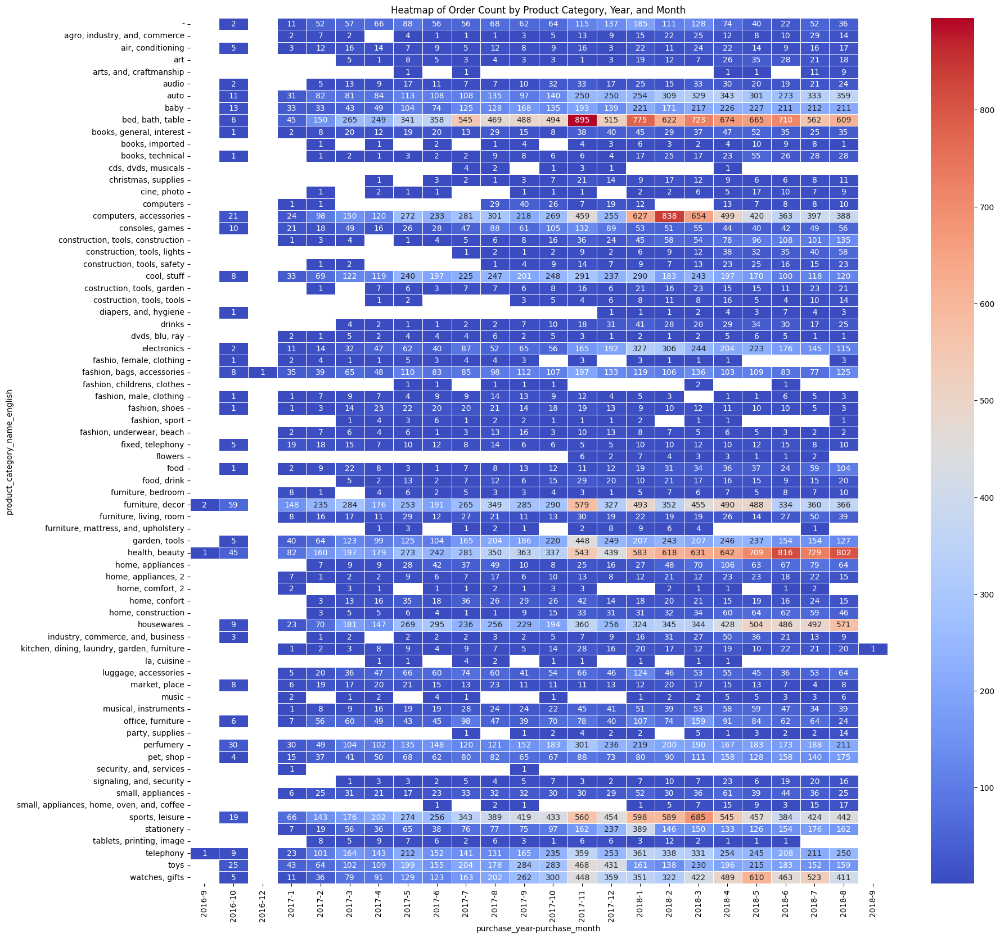

In [1272]:
#petakan pivot ke heatmap
plt.figure(figsize=(20, 20))
sns.heatmap(df_pivot, cmap='coolwarm', annot=True, fmt='g', linewidths=.5)
plt.title('Heatmap of Order Count by Product Category, Year, and Month')
plt.show()

### **Payments Types Numbers of each Products Categories**

In [1266]:
#buat pivot
df_pivot_payment_type = df_merge_all.pivot_table(index='product_category_name_english', columns=['payment_type'], values='order_id', aggfunc='count')
df_pivot_payment_type

payment_type,-,boleto,credit_card,debit_card,voucher
product_category_name_english,,,,,
-,NaN,286.0,1118.0,30.0,48.0
"agro, industry, and, commerce",NaN,51.0,123.0,4.0,5.0
"air, conditioning",NaN,55.0,191.0,3.0,5.0
art,NaN,46.0,144.0,6.0,6.0
"arts, and, craftmanship",NaN,7.0,14.0,3.0,NaN
audio,NaN,79.0,247.0,8.0,16.0
auto,NaN,796.0,3023.0,72.0,100.0
baby,NaN,516.0,2294.0,43.0,80.0
"bed, bath, table",NaN,1702.0,8023.0,131.0,304.0


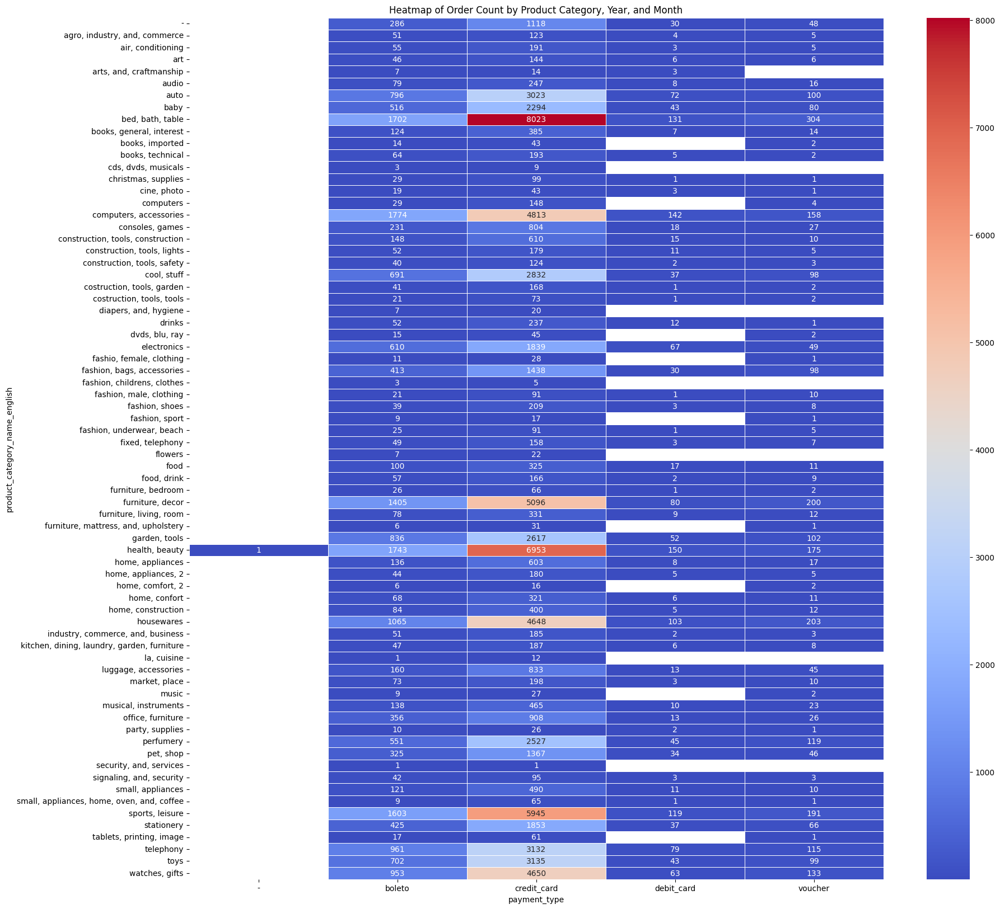

In [1276]:
#petakan pivot ke heatmap
plt.figure(figsize=(20, 20))
sns.heatmap(df_pivot_payment_type, cmap='coolwarm', annot=True, fmt='g', linewidths=.5)
plt.title('Heatmap of Order Count by Product Category, Year, and Month')
plt.show()

### **Total Payment Types Amount for each Products Categories**

In [1267]:
#buat pivot
df_pivot_payment_type_by_monetary = df_merge_all.pivot_table(index='product_category_name_english', columns=['payment_type'], values='Total Price', aggfunc='sum')
df_pivot_payment_type_by_monetary

payment_type,-,boleto,credit_card,debit_card,voucher
product_category_name_english,,,,,
-,NaN,35311.16,141506.24,3191.72,5040.64
"agro, industry, and, commerce",NaN,20552.30,48981.30,1077.38,1919.49
"air, conditioning",NaN,10551.04,43116.62,740.90,616.40
art,NaN,10650.53,12292.46,579.76,679.89
"arts, and, craftmanship",NaN,565.67,1087.36,160.98,NaN
audio,NaN,7700.54,40759.69,875.49,1352.78
auto,NaN,95222.28,477634.35,6574.54,13288.94
baby,NaN,62393.72,337053.07,4424.74,7893.36
"bed, bath, table",NaN,157423.27,839710.89,14004.46,25850.06


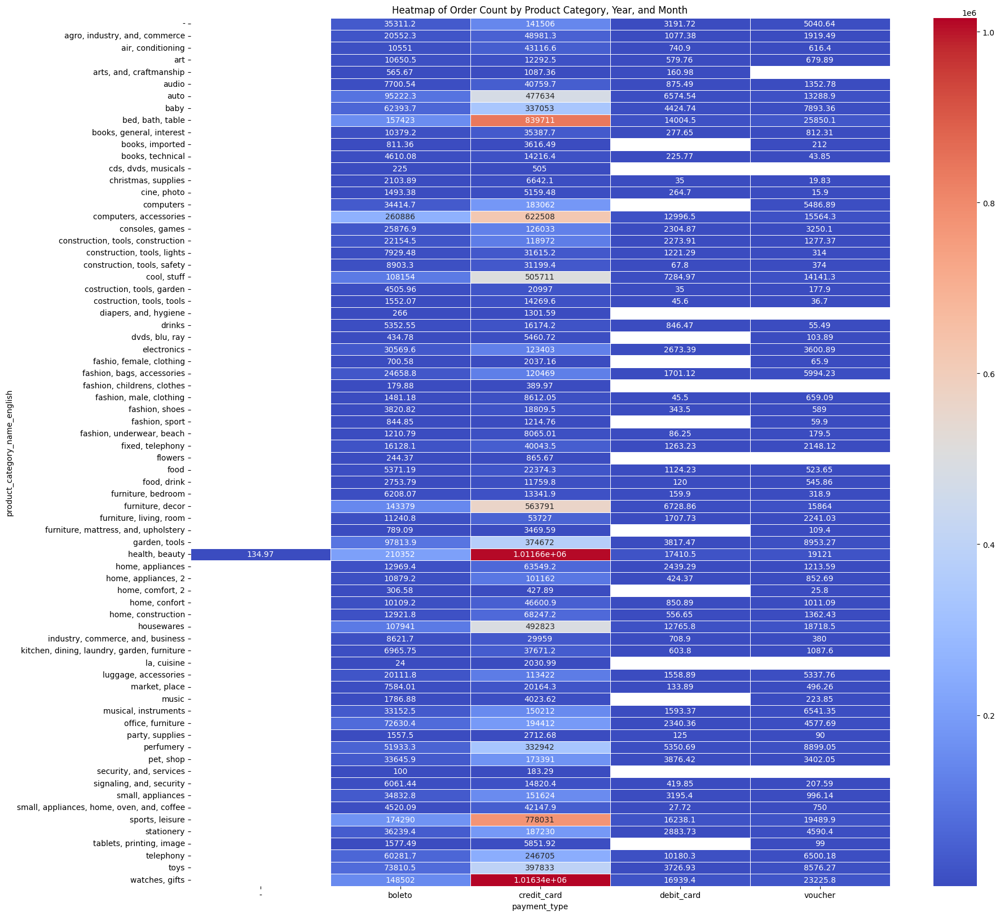

In [1277]:
#petakan pivot ke heatmap
plt.figure(figsize=(20, 20))
sns.heatmap(df_pivot_payment_type_by_monetary, cmap='coolwarm', annot=True, fmt='g', linewidths=.5)
plt.title('Heatmap of Order Count by Product Category, Year, and Month')
plt.show()

### **Sao Paulo's Monthly Transaction Number for each Products Categories**

In [1268]:
#buat pivot
df_pivot_sao_paulo = df_merge_all[df_merge_all['customer_city']=='sao paulo'].pivot_table(index='product_category_name_english', columns=['purchase_year', 'purchase_month'], values='order_id', aggfunc='count')
df_pivot_sao_paulo

purchase_year                               2016  2017                    \
purchase_month                                10    1     2     3     4    
product_category_name_english                                              
-                                            NaN   3.0   6.0  16.0   7.0   
agro, industry, and, commerce                NaN   1.0   1.0   NaN   NaN   
air, conditioning                            NaN   NaN   1.0   6.0   2.0   
art                                          NaN   NaN   NaN   NaN   NaN   
arts, and, craftmanship                      NaN   NaN   NaN   NaN   NaN   
audio                                        NaN   NaN   NaN   1.0   1.0   
auto                                         2.0   2.0   8.0   6.0   7.0   
baby                                         2.0   2.0   4.0   5.0   8.0   
bed, bath, table                             1.0   4.0  18.0  46.0  35.0   
books, general, interest                     NaN   1.0   NaN   2.0   1.0   
books, imported                              NaN   NaN   NaN   NaN   NaN   
books, technical                             1.0   NaN   NaN   NaN   NaN   
cds, dvds, musicals                          NaN   NaN   NaN   NaN   NaN   
christmas, supplies                          NaN   NaN   NaN   NaN   NaN   
cine, photo                                  NaN   NaN   NaN   NaN   NaN   
computers                                    NaN   NaN   NaN   NaN   NaN   
computers, accessories                       1.0   2.0  17.0  18.0  16.0   
consoles, games                              1.0   3.0   3.0   7.0   2.0   
construction, tools, construction            NaN   NaN   NaN   2.0   NaN   
construction, tools, lights                  NaN   NaN   NaN   NaN   NaN   
construction, tools, safety                  NaN   NaN   NaN   NaN   NaN   
cool, stuff                                  NaN   2.0   6.0  12.0  14.0   
costruction, tools, garden                   NaN   NaN   NaN   NaN   1.0   
costruction, tools, tools                    NaN   NaN   NaN   NaN   NaN   
diapers, and, hygiene                        NaN   NaN   NaN   NaN   NaN   
drinks                                       NaN   NaN   NaN   3.0   NaN   
dvds, blu, ray                               NaN   NaN   NaN   NaN   1.0   
electronics                                  NaN   3.0   1.0   2.0   6.0   
fashio, female, clothing                     NaN   NaN   1.0   NaN   NaN   
fashion, bags, accessories                   1.0   2.0   4.0   9.0   6.0   
fashion, childrens, clothes                  NaN   NaN   NaN   NaN   NaN   
fashion, male, clothing                      NaN   NaN   NaN   1.0   3.0   
fashion, shoes                               NaN   1.0   1.0   1.0   NaN   
fashion, sport                               NaN   NaN   NaN   NaN   1.0   
fashion, underwear, beach                    NaN   NaN   1.0   3.0   NaN   
fixed, telephony                             1.0   4.0   3.0   2.0   1.0   
flowers                                      NaN   NaN   NaN   NaN   NaN   
food                                         NaN   1.0   NaN   1.0   2.0   
food, drink                                  NaN   NaN   NaN   2.0   1.0   
furniture, bedroom                           NaN   NaN   NaN   NaN   NaN   
furniture, decor                             7.0  24.0  41.0  55.0  24.0   
furniture, living, room                      NaN   1.0   3.0   1.0   1.0   
furniture, mattress, and, upholstery         NaN   NaN   NaN   NaN   NaN   
garden, tools                                NaN   3.0   7.0  15.0  10.0   
health, beauty                               4.0  14.0  26.0  23.0  26.0   
home, appliances                             NaN   NaN   1.0   2.0   1.0   
home, appliances, 2                          NaN   NaN   NaN   NaN   NaN   
home, comfort, 2                             NaN   NaN   NaN   2.0   1.0   
home, confort                                NaN   NaN   1.0   NaN   3.0   
home, construction                           NaN

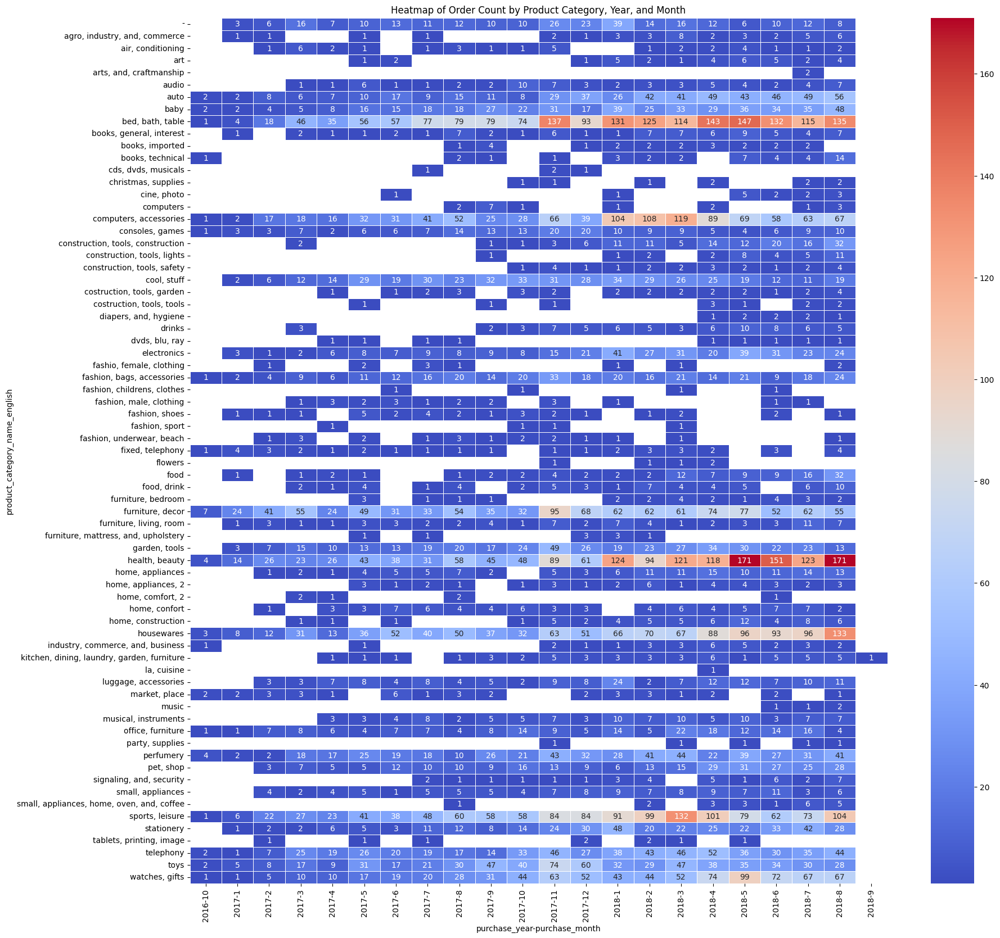

In [1275]:
#petakan pivot ke heatmap
plt.figure(figsize=(20, 20))
sns.heatmap(df_pivot_sao_paulo, cmap='coolwarm', annot=True, fmt='g', linewidths=.5)
plt.title('Heatmap of Order Count by Product Category, Year, and Month')
plt.show()

### **Monthly Revenue for each Products Categories**

In [1269]:
#buat pivot
df_pivot_revenue = df_merge_all.pivot_table(index='product_category_name_english', columns=['purchase_year', 'purchase_month'], values='Total Price', aggfunc='sum')
df_pivot_revenue

purchase_year                                  2016                     2017  \
purchase_month                                   9        10    12        1    
product_category_name_english                                                  
-                                               NaN    65.89   NaN   1702.64   
agro, industry, and, commerce                   NaN      NaN   NaN     65.97   
air, conditioning                               NaN  1707.09   NaN    663.70   
art                                             NaN      NaN   NaN       NaN   
arts, and, craftmanship                         NaN      NaN   NaN       NaN   
audio                                           NaN   156.99   NaN       NaN   
auto                                            NaN  1833.25   NaN   5218.53   
baby                                            NaN  1630.16   NaN   6397.87   
bed, bath, table                                NaN   478.99   NaN   3960.16   
books, general, interest                        NaN   119.50   NaN    234.89   
books, imported                                 NaN      NaN   NaN       NaN   
books, technical                                NaN   267.00   NaN       NaN   
cds, dvds, musicals                             NaN      NaN   NaN       NaN   
christmas, supplies                             NaN      NaN   NaN       NaN   
cine, photo                                     NaN      NaN   NaN       NaN   
computers                                       NaN      NaN   NaN   2199.99   
computers, accessories                          NaN  1399.32   NaN   3924.14   
consoles, games                                 NaN  3882.26   NaN   5954.20   
construction, tools, construction               NaN      NaN   NaN    310.00   
construction, tools, lights                     NaN      NaN   NaN       NaN   
construction, tools, safety                     NaN      NaN   NaN       NaN   
cool, stuff                                     NaN  1111.00   NaN   7784.87   
costruction, tools, garden                      NaN      NaN   NaN       NaN   
costruction, tools, tools                       NaN      NaN   NaN       NaN   
diapers, and, hygiene                           NaN   134.90   NaN       NaN   
drinks                                          NaN      NaN   NaN       NaN   
dvds, blu, ray                                  NaN      NaN   NaN     29.80   
electronics                                     NaN  1306.99   NaN    617.00   
fashio, female, clothing                        NaN    54.90   NaN     77.30   
fashion, bags, accessories                      NaN   508.30  10.9   1671.97   
fashion, childrens, clothes                     NaN      NaN   NaN       NaN   
fashion, male, clothing                         NaN    24.90   NaN    126.90   
fashion, shoes                                  NaN    29.99   NaN     34.90   
fashion, sport                                  NaN      NaN   NaN       NaN   
fashion, underwear, beach                       NaN      NaN   NaN    137.25   
fixed, telephony                                NaN   704.88   NaN    677.12   
flowers                                         NaN      NaN   NaN       NaN   
food                                            NaN    79.90   NaN     42.82   
food, drink                                     NaN      NaN   NaN       NaN   
furniture, bedroom                              NaN      NaN   NaN     73.20   
furniture, decor                              72.89  5807.89   NaN  13521.31   
furniture, living, room                         NaN      NaN   NaN   1241.90   
furniture, mattress, and, upholstery            NaN      NaN   NaN       NaN   
garden, tools                                   NaN  1359.88   NaN   8152.75   
health, beauty                               134.97  4552.51   NaN  12561.32   
home, appliances                                NaN      NaN   NaN       NaN   
home, appliances, 2                             NaN      NaN   NaN   2126.68   


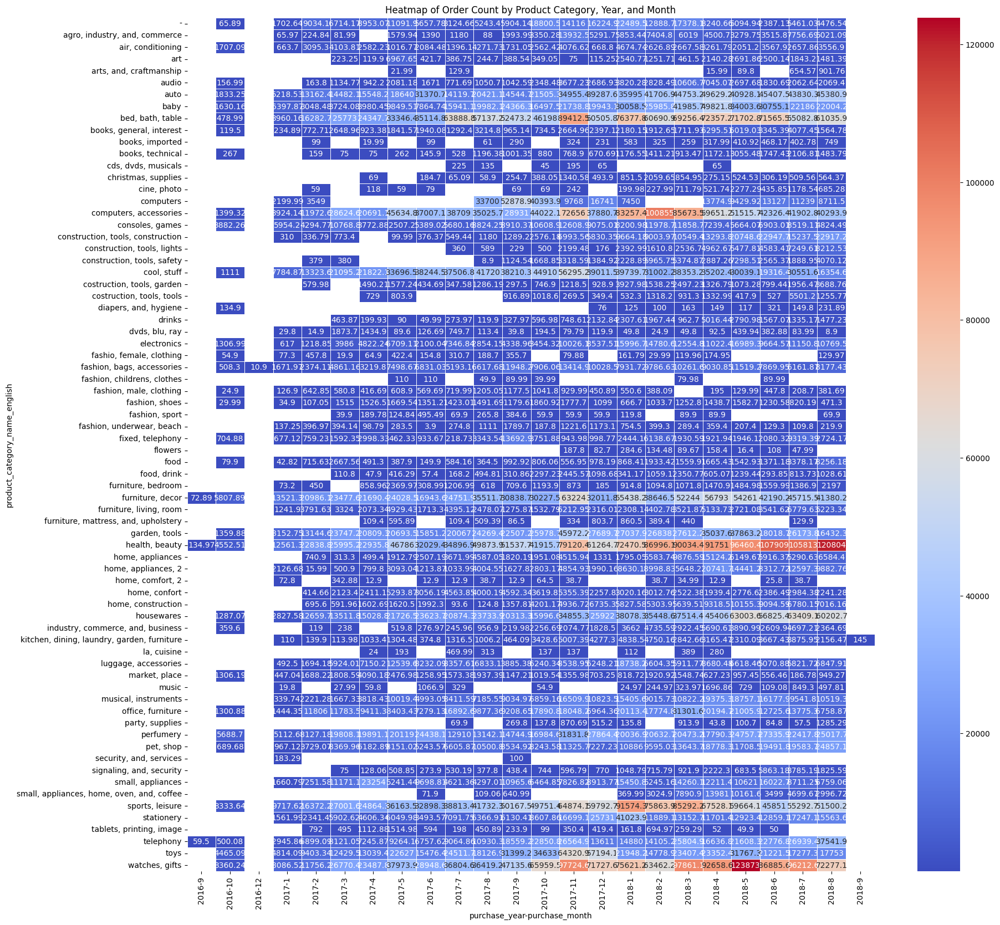

In [1273]:
#petakan pivot ke heatmap
plt.figure(figsize=(20, 20))
sns.heatmap(df_pivot_revenue, cmap='coolwarm', annot=True, fmt='g', linewidths=.5)
plt.title('Heatmap of Order Count by Product Category, Year, and Month')
plt.show()

### **Monthly Transaction Trends for each Products Categories**

In [1271]:
# membuat heatmap Monthly Transaction Trends for each Products Categories
df_pivot_yearly_trend = df_merge_all.pivot_table(index=['product_category_name_english'], columns=['purchase_month'], values='order_id', aggfunc='count')
df_pivot_yearly_trend

purchase_month,1,2,3,4,5,6,7,8,9,10,11,12
product_category_name_english,,,,,,,,,,,,
-,196.0,163.0,185.0,140.0,128.0,78.0,108.0,104.0,62.0,66.0,115.0,137.0
"agro, industry, and, commerce",17.0,29.0,27.0,12.0,12.0,11.0,30.0,15.0,3.0,5.0,13.0,9.0
"air, conditioning",25.0,23.0,40.0,36.0,21.0,18.0,21.0,29.0,8.0,14.0,16.0,3.0
art,19.0,12.0,12.0,27.0,43.0,33.0,24.0,22.0,3.0,3.0,1.0,3.0
"arts, and, craftmanship",NaN,NaN,NaN,1.0,2.0,NaN,12.0,9.0,NaN,NaN,NaN,NaN
audio,25.0,20.0,46.0,39.0,37.0,30.0,28.0,31.0,10.0,34.0,33.0,17.0
auto,285.0,391.0,410.0,427.0,414.0,381.0,441.0,494.0,97.0,151.0,250.0,250.0
baby,254.0,204.0,260.0,275.0,331.0,285.0,337.0,339.0,168.0,148.0,193.0,139.0
"bed, bath, table",820.0,772.0,988.0,923.0,1006.0,1068.0,1107.0,1078.0,488.0,500.0,895.0,515.0


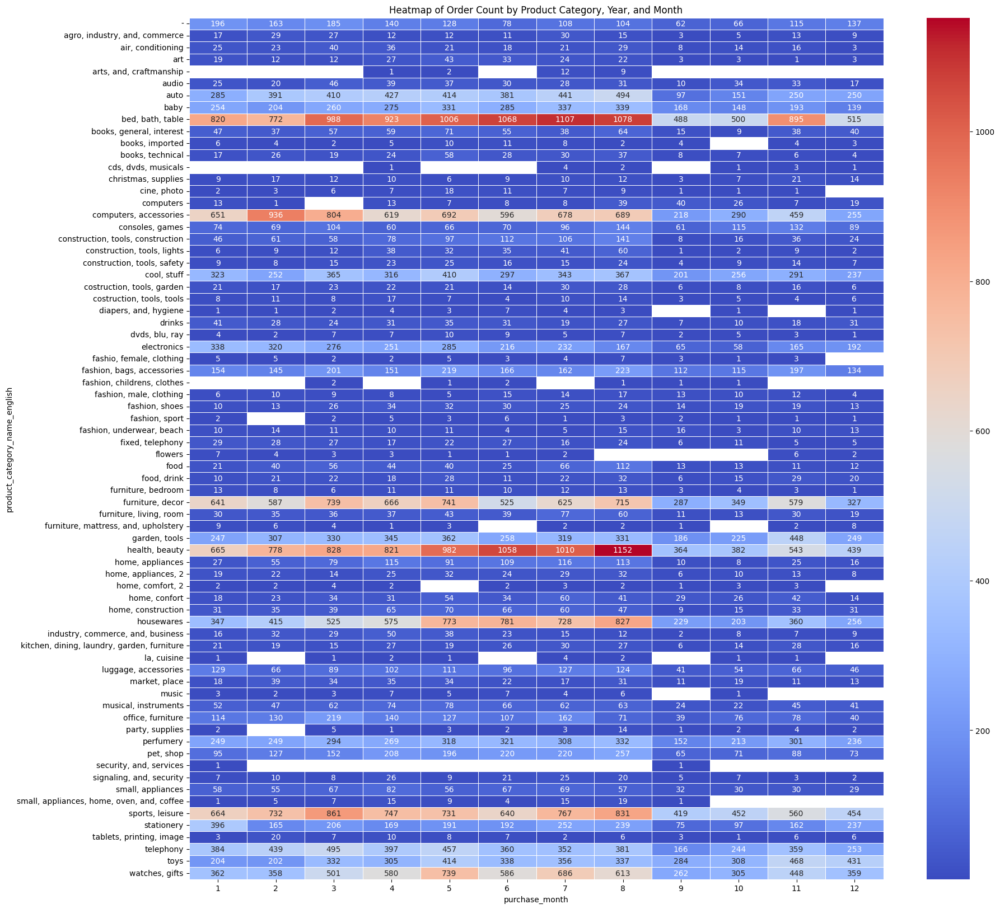

In [1274]:
# membuat heatmap Monthly Transaction Trends for each Products Categories
plt.figure(figsize=(20, 20))
sns.heatmap(df_pivot_yearly_trend, cmap='coolwarm', annot=True, fmt='g', linewidths=.5)
plt.title('Heatmap of Order Count by Product Category, Year, and Month')
plt.show()

### **Monthly Revenue Trends for each Products Categories**

In [1285]:
# membuat pivot Monthly Revenue Trends for each Products Categories
df_pivot_yearly_revenue_trend = df_merge_all.pivot_table(index=['product_category_name_english'], columns=['purchase_month'], values='Total Payments', aggfunc='sum')
df_pivot_yearly_revenue_trend

purchase_month,1,2,3,4,5,6,7,8,9,10,11,12
product_category_name_english,,,,,,,,,,,,
-,27898.27,25154.94,29405.30,20855.14,20208.35,9593.63,11631.00,12010.17,7517.42,22440.09,16669.72,18408.33
"agro, industry, and, commerce",6404.27,8846.89,6677.78,4783.66,5196.96,5265.10,9939.86,5768.34,2119.69,3558.43,14610.32,5664.04
"air, conditioning",5942.85,6332.38,7658.73,6794.69,3637.42,6381.46,4980.57,8571.31,1900.33,4774.81,4698.43,722.34
art,2972.75,1560.83,940.21,2770.21,10623.03,3709.29,2690.63,2428.14,435.85,400.45,92.78,191.76
"arts, and, craftmanship",NaN,NaN,NaN,34.22,174.12,NaN,1048.78,1069.05,NaN,NaN,NaN,NaN
audio,4233.39,3286.43,12989.70,9766.66,5500.61,4046.63,3292.23,3734.92,1191.79,2911.76,4195.14,2941.12
auto,51134.70,67161.22,73172.84,77874.81,72930.90,88793.72,70120.66,80157.19,17181.73,29093.48,42452.42,47329.03
baby,44804.13,34794.53,52109.42,66716.07,55616.63,49671.64,47252.38,53003.65,29650.33,22546.15,27647.45,22995.08
"bed, bath, table",117861.72,100114.07,134961.17,138049.93,141273.46,148657.78,168323.33,162366.17,71732.41,74732.36,128499.41,70370.75


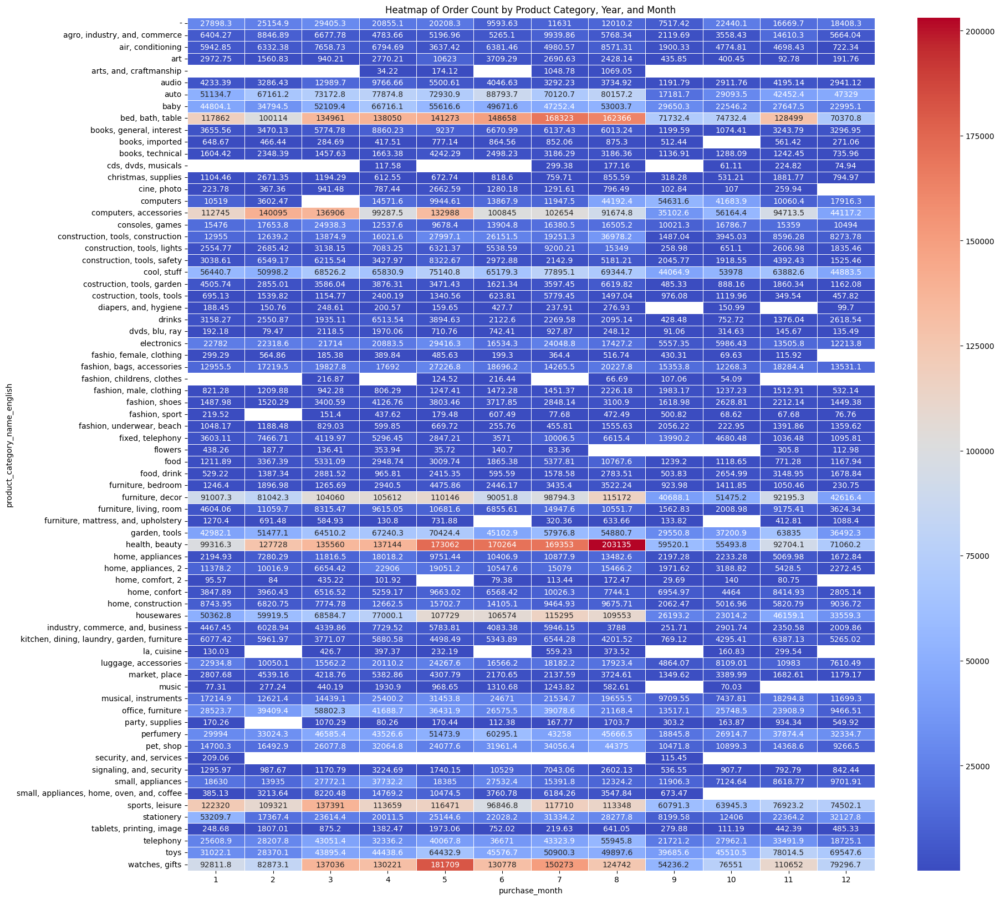

In [1286]:
# membuat heatmap Monthly Revenue Trends for each Products Categories
plt.figure(figsize=(20, 20))
sns.heatmap(df_pivot_yearly_revenue_trend, cmap='coolwarm', annot=True, fmt='g', linewidths=.5)
plt.title('Heatmap of Order Count by Product Category, Year, and Month')
plt.show()

## **Conclusion**

**Indonesian Language**

Kita menemukan Customer yang cukup besar kontribusinya terhadap penjualan perusahaan yaitu customer dengan Customer ID:
  - 1617b1357756262bfa56ab541c47bc16

Berdasarkan ***recency*** dari kategori produk secara keseluruhan, urutan tingkat recency dari yang terbaru ke yang terlama yaitu:
  - 	kitchen, dining, laundry, garden, furniture
  -   food
  -   computers, accessories
  -   health, beauty
  -   toys

Berdasarkan ***frequency*** dari kategori produk secara keseluruhan, urutan tingkat recency dari yang terbaru ke yang terlama yaitu:
  - 	bed, bath, table
  -   health, beauty
  -   sports, leisure
  -   computers, accessories
  -   furniture, decor

Berdasarkan ***monetary & RFM Score*** dari kategori produk secara keseluruhan, urutan tingkat recency dari yang terbaru ke yang terlama yaitu:
  - 	health, beauty
  -   watches, gifts
  -   bed, bath, table
  -   sports, leisure
  -   computers, accessories

Kota yang jumlah pembelian paling banyak yaitu ada di Sao Paulo dengan pembelian terbanyak yaitu kategori produk ***bed, bath dan table***, kemudian ***health, beauty*** dan ***sports, leisure***. Kota kedua yang teratas yang jumlah pembeliannya paling banyak yaitu ada di Rio de Janeiro.

Namun kalau dilihat dari segi monetary, kota yang penjualannya paling menguntungkan yaitu Sao Paulo, dengan urutan tertinggi pada produk ***health, beauty***, ***bed, bath, table*** dan ***watches, gift***.

***Bed, bath dan table*** mengalami puncak penjualan pada November 2017, dan ***health, beauty*** mengalami puncak penjualan pada Juni 2017 dan penjuala ***computer, accessories*** puncak pada Februari 2018.

Kebanyakan pembelian ***Bed, bath dan table*** dilakukan melalui credit card. Terbanyak kedua yang melakukan pembelian credit card yaitu ***health, beauty*** dan ***sports, leisure***.

Keuntungan terbanyak yang diperoleh dari channel penjualan kartu kredit berasal dari kategori produk ***watches, gifts*** dan ***health,beauty*** sementara ***sport, leisure*** dan ***bed,bath, table*** menduduki posisi ke tiga dan ke empat. Padahal dari tingkat freqiency ***watches, gifts*** tidak menduduki posisi pembelian terbanyak.

Pada kota Sao Paulo, terjadi penjualan ***health, beauty*** terbanyak pada bulan Mei 2018 dan Agustus 2018, dengan keuntungan tertinggi di Agustus 2018. Di kota Sao Paulo penjualan paling banyak terjadi pada kategori ***health, beauty*** dan ***bed, bath, table***. Sementara penjualan tertinggi kedua terjadi pada kategori ***watches, gifts*** pada bulan Mei 2018.

Dari segi siklus tahunan dari 2016 - 2018, jumlah transaksi pembelian dari awal tahun mengalami peningkatan bertahap hingga puncaknya ada di bulan Agustus, khususnya kategori produk:
- ***Health, beauty***
- ***Bed, bath, table***
- ***Housewares***
- ***Sport, leisures***

Pola yang serupa kita lihat terhadap revenue, peningkatan penjualan untuk produk ***health, beauty***, ***bed, bath, table*** terjadi mulai dari awal tahun hingga ke puncaknya sekitar bulan July, Agustus. Sementara penjualan ***watches, gift*** terjadi puncaknya di bulan Mei.

Maka kita dapat menjawab pertanyaan rumusan masalah di atas:
1. Apa saja kategori produk dengan Penjualan dan Revenue Terbanyak?
   Kategori Produk yang Revenue dan penjualannya terbanyak antara lain:
   - ***Bed, Bath, Table***
   - ***Health, Beauty***
   - ***Sports, Leisure***
   -***wWtches, Gifts***
2. Apa saja kategori Produk dengan Tingkat Skor RFM terbaik?
  - 	health, beauty
  -   watches, gifts
  -   bed, bath, table
  -   sports, leisure
  -   computers, accessories
3. Bagaimana Trend dan siklus penjualan masing-masing kategori produk?
  -   Menaik perlahan pada awal tahun dan mencapai puncak sekitar bulan Juli dan Agustus.
4. Produk mana yang memiliki pertumbuhan signifikan dari tahun-tahun sebelumnya?
  - Health dan Beauty
  - Watches and Gift

**Usulan Strategi Bisnis:**
1. **Strategi Promosi**: Berdasarkan data di atas maka bisnis dapat lebih berfokus untuk memberikan promo pada produk dengan kategori ***Health dan Beauty*** promo ini dilakukan khususnya di kota dengan jumlah Customer yang banyak seperti di Sao Paulo, Rio de Janero. Berikan diskon dan harga khusus bagi customer yang sering melakukan pembelajaan produk kecantika, dan tawarkan membership dengan reward poin belanja yang dapat diakumulasi untuk melakukan pembelajaan barang health dan beauty berikutnya.
# 2. **Stock Barang di tambah di sekitar bulan Juli dan Agustus**: karena kita menemukan trend penjualan memuncak di pertengahan tahun, maka kita perlu menyiapkan persediaan barang yang lebih banyak di bulan tersebut untuk menghadapi demand yang memuncak.
3. **Kerja sama dengan Bank:** Ajak kerja sama promosi potongan harga untuk pembelian barang melalui credit card. Khususnya untuk merchant-merchant yang revenuenya paling banyak diperoleh melalui credit card seperti produk ***Watches dan Gift*** dan ***Health dan Beauty***. Lakukan promosi ini ketika penjualan belum mencapai puncak siklus (di luar bulan Agustus dan bulan Mei).
4. **Strategi Akuisisi Channel:** Pertimbangkan untuk melakukan strategi akuisisi channel hilir seperti distributor khususnya untuk produk-produk yang penjualannya paling banyak yaitu untuk ***bed,bath,table***, ***watches, gifts***,***health,beauty***,***sports,leisure***. Strategi ini dilakukan untuk minimasi biaya yang muncul, dan menciptakan penawaran harga dan value yang lebih unggul ke Customer.
5. **Ciptakan produk sendiri:** melanjutkan dari poin 4, apabila permintaan barang begitu besar, maka company dapat mempertimbangkan untuk memenuhi demand dengan membuat produk untuk masing-masing kategori dengan harga murah. Hal ini dilakukan agar permintaan terhadapt barang-barang dalam produk yang termasuk dalam kategori revenue tinggi terpenuhi.
6. **Implementasi Sistem Rekomendasi** Setelah kita dapat mengetahui barang-barang apa saja yang paling banyak dibeli setiap pelanggan, kita dapat mulai mempertimbangkan implementasi sistem rekomendasi dalam platform web. Sistem rekomendasi ini ditujukkan untuk menawarkan barang-barang yang sekiranya diminati pelanggan yang berbeda (personalisasi penawaran) sehingga peluang mereka untuk membeli barang meningkat.

***English Translation:***


We found a customer who has a significant contribution to the company's sales, namely the customer with Customer ID:
  - 1617b1357756262bfa56ab541c47bc16

Based on the recency of product categories overall, the order of recency levels from newest to oldest is:
  -  kitchen, dining, laundry, garden, furniture
  -   food
  -   computers, accessories
  -   health, beauty
  -   toys

Based on frequency of product categories overall, the order of recency levels from newest to oldest is:
  -  bed, bath, table
  -   health, beauty
  -   sports, leisure
  -   computers, accessories
  -   furniture, decor

Based on monetary & RFM Score of product categories overall, the order of recency levels from newest to oldest is:
  -  health, beauty
  -   watches, gifts
  -   bed, bath, table
  -   sports, leisure
  -   computers, accessories

The city with the highest number of purchases is in Sao Paulo, with the highest purchases in the product category bed, bath, and table, followed by health, beauty and sports, leisure. The second top city in terms of the highest number of purchases is in Rio de Janeiro.

However, in terms of monetary value, the city with the most profitable sales is Sao Paulo, with the highest ranking in the products health, beauty, bed, bath, table, and watches, gifts.

Bed, bath, and table experienced peak sales in November 2017, and health, beauty reached its sales peak in June 2017, while computers, accessories peaked in February 2018.

Most purchases of bed, bath, and table are made through credit cards. The second highest in credit card purchases are health, beauty and sports, leisure.

The highest profits obtained from credit card sales channels come from the product categories watches, gifts and health, beauty, while sports, leisure and bed, bath, table occupy the third and fourth positions. Surprisingly, watches, gifts, despite not having the highest frequency, ranks first in revenue.

In Sao Paulo, the highest sales of health, beauty occurred in May 2018 and August 2018, with the highest profit in August 2018. In Sao Paulo, the highest sales occur in the categories health, beauty and bed, bath, table. The second-highest sales occur in the watches, gifts category in May 2018.

In terms of the annual cycle from 2016 to 2018, the number of purchase transactions gradually increased from the beginning of the year, reaching its peak in August, especially for product categories:

  - Health, beauty
  - Bed, bath, table
  - Housewares
  - Sport, leisures

A similar pattern is observed in revenue, with increasing sales for health, beauty and bed, bath, table from the beginning of the year until around July and August. Meanwhile, the peak sales for watches, gifts occur in May.

Therefore, we can answer the formulated problem questions as follows:

Categories with the Highest Sales and Revenue?
Categories with the highest revenue and sales include:

  - Bed, Bath, Table
  - Health, Beauty
  - Sports, Leisure
  - Watches, Gifts

Categories with the Best RFM Score?

  -  Health, Beauty
  -  Watches, Gifts
  -  Bed, Bath, Table
  -  Sports, Leisure
  -  Computers, Accessories

Sales Trend and Cycle for Each Product Category?
  Increasing gradually at the beginning of the year and reaching its peak around July and August.

Products with Significant Growth from Previous Years?

- Health and Beauty
- Watches and Gift

**Business Strategy Recommendations:**

**Promotion Strategy:** Based on the above data, the business can focus on promoting products in the Health and Beauty category, especially in cities with a large number of customers such as Sao Paulo and Rio de Janeiro. Offer discounts and special prices for customers who frequently purchase beauty products and introduce a membership program with shopping reward points for future health and beauty purchases.

**Increase Stock in July and August:** Since the sales trend peaks in the middle of the year, it's essential to increase stock levels in those months to meet the peak demand.

**Collaboration with Banks:** Collaborate with banks to offer promotions and discounts for purchases made through credit cards, especially for high-revenue categories like Watches and Gifts and Health and Beauty. Implement these promotions when sales are not at their peak (outside of August and May).

**Channel Acquisition Strategy:** Consider acquiring downstream channels such as distributors, especially for products with the highest sales, including bed, bath, table, watches, gifts, health, beauty, and sports, leisure. This strategy aims to minimize costs and create superior offers in terms of price and value to customers.

**Create Own Products:** Building on point 4, if demand is significant, the company can consider meeting demand by manufacturing its products for each category at a more affordable price. This is done to ensure that the demand for high-revenue categories is met.

**Implement Recommendation Systems:** After identifying which products each customer buys the most, consider implementing a recommendation system on the web platform. This system is intended to offer personalized recommendations for products that different customers may be interested in, increasing the likelihood of them making a purchase.